In this notebook I perform an exploratory analysis in order to get some insights

- To investigate the relationship between the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings 

- To examine key indicators (signals produced from the patterns observed in the movements ) of hourly pay and how that has changed after the pandemic.

- 

company, based on that I create a predictive model that allows to foresee which employee is going to leave next.

### Business Understanding

### Objectives:
- PRIMARY: To investigate the relationship between the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings - workplace analysis - Nomis - Official Labour Market Statistics from 2017-2021.
-   SECONDARY: To examine key indicators of hourly pay and how that has changed after the pandemic. 
-   TERTIARY: To obtain open-source data, prepare for analysis by taking required data for it using CRISP DM process and visualise those patterns of hourly pay before and after the pandemic.


**Research Questions:**



	•	Can we compare the hourly pay of part time and full-time workers in the UK, before and after the COVID 19 pandemic?
	•	Has the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK?


In [1]:
import numpy as np
import pandas as pd

# Make sure figures appear inline in Ipython Notebook
%matplotlib inline

import matplotlib
import seaborn as sns
import matplotlib.dates as md
from matplotlib import pyplot as plt

# 3rd party
import plotly.graph_objs as go


In [2]:
df = pd.read_csv('data/formatted-igp-3.csv', delimiter = ',', encoding='latin-1', header=0)
df.head()


,Unnamed: 0,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [3]:
# drop 'Unnamed: 0' column
df.drop('Unnamed: 0', axis=1, inplace=True)


In [4]:
# show 
df.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [5]:
df.tail()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,-,-23.9,-,41.3,-,...,-3.7,-,-,-,-,-,-,-,-1.8,-
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,-,-,-,-,19.1,-,...,-,-,-,-,-,-,-,-,-,-
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,-,28.9,-,-4.4,-,...,-18.3,-,-,-,-,-,-,-,-,-
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,-,-23.1,-,-,-,...,-20.3,-,-,-,-,-,-,-,-,-
10031,Part Time Workers,Hours worked - overtime,Wiltshire,ecounty,-26.5,-,-5.8,-,10.5,-,...,-,-,-,-,-,-,-,-,-,-


In [7]:
# show dimension and check datatype
print("Size/Shape of the dataset: ",df.shape)
print("\nChecking Data-type of each column:\n",df.dtypes)

Size/Shape of the dataset:  (10032, 24)

Checking Data-type of each column:
 work_type     object
pay_type      object
area          object
area_type     object
2012_pay      object
2012_conf%    object
2013_pay      object
2013_conf%    object
2014_pay      object
2014_conf%    object
2015_pay      object
2015_conf%    object
2016_pay      object
2016_conf%    object
2017_pay      object
2017_conf%    object
2018_pay      object
2018_conf%    object
2019_pay      object
2019_conf%    object
2020_pay      object
2020_conf%    object
2021_pay      object
2021_conf%    object
dtype: object


check how many null values we have

In [8]:
# is there null values
df.isnull().sum()

work_type     0
pay_type      0
area          0
area_type     0
2012_pay      0
2012_conf%    0
2013_pay      0
2013_conf%    0
2014_pay      0
2014_conf%    0
2015_pay      0
2015_conf%    0
2016_pay      0
2016_conf%    0
2017_pay      0
2017_conf%    0
2018_pay      0
2018_conf%    0
2019_pay      0
2019_conf%    0
2020_pay      0
2020_conf%    0
2021_pay      0
2021_conf%    0
dtype: int64

Because "NaN's" were denoted by hyphens `-`, our results indicate that there are no "NaN's" in the data. Let's convert the replace the hyphens with nans.

In [13]:
# Replace '-' with nan
df = df.replace('-', np.nan)

In [14]:
# sum the num of nans
df.isnull().sum()

work_type        0
pay_type         0
area             0
area_type        0
2012_pay       840
2012_conf%    4416
2013_pay       861
2013_conf%    4414
2014_pay       854
2014_conf%    4410
2015_pay       853
2015_conf%    4416
2016_pay       862
2016_conf%    4417
2017_pay       872
2017_conf%    4417
2018_pay      4532
2018_conf%    4540
2019_pay      4532
2019_conf%    4541
2020_pay      4458
2020_conf%    4551
2021_pay      1374
2021_conf%    4666
dtype: int64

- work_type, pay_type, Area and area_type has no nan's.
- the 2021_conf%' confidence column has the highest number of nan's
- 2018_pay and 2019_pay columns has the highest number of nan's.

a good function to check nan's

In [19]:
# Check for missing values
def missing_values_table(df):
    # number of missing values
    mis_val = df.isnull().sum()
    # % of missing values
    mis_val_percent = 100 * mis_val / len(df)
    # make table # axis '0' concat along index, '1' column
    mis_val_table = pd.concat([mis_val,mis_val_percent],axis=1) 
    # rename columns
    mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0:'Missing Values',1:'% of Total Values'})
    # sort by column
    mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1]!=0].sort_values(
        '% of Total Values',ascending=False).round(1) #Review
    print("Your selected datset has "+str(df.shape[1])+" columns and "+str(len(df))+" observations.\n"
         "There are "+str(mis_val_table_ren_columns.shape[0])+" columns that have missing values.")
    # return the dataframe with missing info
    return mis_val_table_ren_columns



In [20]:
missing_values_table(df)

Your selected datset has 24 columns and 10032 observations.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
2021_conf%,4666,46.5
2020_conf%,4551,45.4
2019_conf%,4541,45.3
2018_conf%,4540,45.3
2019_pay,4532,45.2
2018_pay,4532,45.2
2020_pay,4458,44.4
2016_conf%,4417,44.0
2017_conf%,4417,44.0
2015_conf%,4416,44.0


In [21]:
# index the dataframe columns
df.columns[3:]

Index(['area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%'],
      dtype='object')

In [13]:
# show frames of the indexed columns
df[df.columns[3:]]

,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,10731000,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,country,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,9312000,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,country,466000,1.9,473000,1.9,479000,1.9,500000,1.9,487000,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,country,907000,1.3,900000,1.3,907000,1.3,931000,1.3,933000,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,country,306000,2.3,279000,2.5,305000,2.4,335000,2.3,354000,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10027,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,-16.6,NaN,17.4,...,-3.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.8,NaN
10028,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,-21.6,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10029,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,-12.3,NaN,11.3,...,-18.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10030,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,NaN,NaN,-12.6,...,-20.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's examine which aspects are more associated since the level of pay and confidence are the main factors that interest us. 

## Data Pre-processing

In [14]:
# show dataframe
df.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,487000,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,941000,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,358000,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3


In [15]:
# see unique work_type's
df['work_type'].unique()

array(['Male Full Time Workers', 'Male Part Time Workers',
       'Female Full Time Workers', 'Female Part Time Workers',
       'Full Time Workers', 'Part Time Workers'], dtype=object)

In [16]:
# see unique pay_type's
df['pay_type'].unique()

array(['Weekly pay - basic', 'Hourly pay - gross',
       'Hourly pay - excluding overtime', 'Hours worked - total',
       'Hours worked - basic', 'Hours worked - overtime',
       'Weekly pay - gross'], dtype=object)

we can see work and pay type can be feature engineered to give us more features.

**We can get the**

- sex ( genders, male or female) [sex]
- working standard (is it full or part time) [work_standard]
- working time (did the individual got paid weekly, hourly, hours worked etc.) [work_time]
- pay standard (here we check for the work standard, either basic etc.) [pay_standard]
- separate the country from the count. 


let make a copy to prevent overwritting

In [22]:
# make a copy
data = df.copy()

Sex

the sex features can be extracted from the work_type column.

In [25]:
# test to see how this will extract
data['work_type'].iloc[-35].split()[0]

'Part'

In [26]:
# string extraction function
def sexExtract(t):
    t = t.split()[0]
    if t=='Part' or t=='Full':
        return None
    else:
        return t

In [27]:
sexExtract(data['work_type'].iloc[35])

'Male'

In [28]:
# set result to new sex column
data['sex'] = data['work_type'].apply(lambda x: sexExtract(x))

In [29]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2,Male
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3,Male
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,1.9,489000,1.9,492000,1.9,484000,2.2,504000,2.2,Male
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,1.3,949000,1.3,931000,1.4,859000,1.7,906000,1.6,Male
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,2.2,343000,2.3,368000,2.3,414000,2.4,448000,2.3,Male


In [30]:
data.tail()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.8,NaN,None
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
10031,Part Time Workers,Hours worked - overtime,Wiltshire,ecounty,-26.5,NaN,-5.8,NaN,10.5,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


**working standard** 

Working standard (is it full or part time).

work_standard, features can be extracted from the work_type column.

In [31]:
# test to see how this will extract
data['work_type'].iloc[35].split()[:-1]

['Male', 'Full', 'Time']

In [26]:
data['work_type'].iloc[-5]

'Part Time Workers'

In [27]:
data['work_type'].iloc[135].split()[1:3]

['Full', 'Time']

In [32]:
# extract string
def workstandardExtract(t):
    t= t.split()
    
    if len(t) > 3:
        return ' '.join(t[1:3])
    else:
        return ' '.join(t[:-1])
    

In [34]:
# test function
workstandardExtract(data['work_type'].iloc[-5])

'Part Time'

In [35]:
# set result to column
data['work_standard'] = data['work_type'].apply(lambda x: workstandardExtract(x))

In [36]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,489000,1.9,492000,1.9,484000,2.2,504000,2.2,Male,Full Time
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,949000,1.3,931000,1.4,859000,1.7,906000,1.6,Male,Full Time
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,343000,2.3,368000,2.3,414000,2.4,448000,2.3,Male,Full Time


**working time**

working time (did the individual got paid weekly, hourly, hours worked etc.) 

work_time, features can be extracted from the pay_type column.

In [37]:
data['pay_type'].iloc[-35].split()[0]

'Hours'

In [46]:
# def worktimeExtract(t):
#     return t.split()[0]

In [39]:
# worktimeExtract(data['pay_type'].iloc[35])

'Weekly'

In [44]:
data['work_time'] = data['pay_type'].apply(lambda x: x.split()[0])

In [45]:
# set result to column
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,492000,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,931000,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,368000,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly


Lets get the pay standard (here we check for the work standard, either basic etc.) 

pay_standard, features can be extracted from the pay_type column.

In [47]:
data['pay_type'].iloc[334].split()[-1]

'gross'

In [48]:
# def paystandardExtract(t):
#     # split with hyphen and index the last in the list
#     return t.split('-')[-1]

In [49]:
# split with hyphen and index the last in the list
data['pay_standard'] = data['pay_type'].apply(lambda x: x.split('-')[-1])

In [50]:
data.head()

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,10930000,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,9508000,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,492000,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,931000,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,368000,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly


Get the countries.

In [52]:
df.area.unique()

array(['Great Britain', 'England', 'Wales', 'Scotland',
       'Northern Ireland', 'England and Wales', 'Durham (County)',
       'Northumb', 'Tyne and Wear (Met County)', 'Cheshire', 'Cumbria',
       'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk',
       'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

 Great Britain consists of just England, Wales and Scotland, whereas the United Kingdom also includes Northern Ireland, as its long name states.
 
 ref: https://theculturetrip.com/europe/united-kingdom/articles/whats-the-difference-between-great-britain-and-the-united-kingdom/

Sovereign state: United Kingdom

county's are states



In [53]:
# set the country and states into directionary for better referencing
{
'Great Britain':['England', 'Wales', 'Scotland'],
    
 'England':['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
           'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
           'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire'], 
    
 'Wales':[], 
 'Scotland':[],
 'U.K':['England', 'Wales', 'Scotland', 'Northern Ireland',]
}

{'Great Britain': ['England', 'Wales', 'Scotland'],
 'England': ['Northumb',
  'Tyne and Wear (Met County)',
  'Durham (County)',
  'Cheshire',
  'Cumbria',
  'Greater Manchester (Met County)',
  'Lancashire',
  'Merseyside (Met County)',
  'North Yorkshire',
  'South Yorkshire (Met County)',
  'West Yorkshire (Met County)',
  'Derbyshire',
  'Leicestershire',
  'Lincolnshire',
  'Northamptonshire',
  'Nottinghamshire',
  'Shropshire',
  'Staffordshire',
  'Warwickshire',
  'West Midlands (Met County)',
  'Worcestershire',
  'Bedfordshire',
  'Cambridgeshire',
  'Essex',
  'Hertfordshire',
  'Norfolk',
  'Suffolk',
  'Inner London',
  'Outer London',
  'Buckinghamshire',
  'East Sussex',
  'Hampshire',
  'Kent',
  'Oxfordshire',
  'Surrey',
  'West Sussex',
  'Cornwall and Isles of Scilly',
  'Devon',
  'Dorset',
  'Gloucestershire',
  'Somerset',
  'Wiltshire'],
 'Wales': [],
 'Scotland': [],
 'U.K': ['England', 'Wales', 'Scotland', 'Northern Ireland']}

In [58]:
# set england areas
england_areas = ['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
           'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
           'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
       'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
       'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
       'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
       'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
       'Gloucestershire', 'Somerset', 'Wiltshire']

great_britain = ['England', 'Wales', 'Scotland','England and Wales','Northern Ireland']

uk =  ['England', 'Wales', 'Scotland', 'Northern Ireland']

In [59]:
# england_areas = ['Northumb', 'Tyne and Wear (Met County)','Durham (County)', 'Cheshire', 'Cumbria',
#            'Greater Manchester (Met County)', 'Lancashire', 'Merseyside (Met County)', 'North Yorkshire',
#            'South Yorkshire (Met County)', 'West Yorkshire (Met County)','Derbyshire', 'Leicestershire', 'Lincolnshire', 'Northamptonshire',
#        'Nottinghamshire', 'Shropshire', 'Staffordshire', 'Warwickshire',
#        'West Midlands (Met County)', 'Worcestershire', 'Bedfordshire',
#        'Cambridgeshire', 'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London', 'Outer London', 'Buckinghamshire', 'East Sussex',
#        'Hampshire', 'Kent', 'Oxfordshire', 'Surrey', 'West Sussex',
#        'Cornwall and Isles of Scilly', 'Devon', 'Dorset',
#        'Gloucestershire', 'Somerset', 'Wiltshire']



In [60]:
# get countries that makes Great britain.
great_britain = ['England', 'Wales', 'Scotland','England and Wales','Northern Ireland']


a country is the same thing as a sovereign state, which can also be called a “nation” or a “nation-state.”

In [61]:
# function to search country from great britain
def areacountrySearch(t):
    if t == 'Great Britain':
        return 'Great Britain'
    elif t == 'Wales':
        return 'Wales'
    elif t == 'Scotland':
        return 'Scotland'
    elif t == 'Northern Ireland':
        return 'Northern Ireland'
    elif t == 'England and Wales':
        return 'England and Wales'
   
    elif t == 'England' or t in england_areas:
        return 'England'
   

In [62]:
# set area to their state
data['state'] = data['area'].apply(lambda x: areacountrySearch(x))

In [63]:
data

,work_type,pay_type,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time,state
0,Male Full Time Workers,Weekly pay - basic,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly,Great Britain
1,Male Full Time Workers,Weekly pay - basic,England,country,8778000,0.2,8895000,0.2,9016000,0.2,...,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly,England
2,Male Full Time Workers,Weekly pay - basic,Wales,country,466000,1.9,473000,1.9,479000,1.9,...,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly,Wales
3,Male Full Time Workers,Weekly pay - basic,Scotland,country,907000,1.3,900000,1.3,907000,1.3,...,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly,Scotland
4,Male Full Time Workers,Weekly pay - basic,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,...,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly,Northern Ireland
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10027,Part Time Workers,Hours worked - overtime,Devon,ecounty,-13.3,NaN,-23.9,NaN,41.3,NaN,...,NaN,NaN,NaN,-1.8,NaN,None,Part Time,overtime,Hours,England
10028,Part Time Workers,Hours worked - overtime,Dorset,ecounty,NaN,NaN,NaN,NaN,19.1,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England
10029,Part Time Workers,Hours worked - overtime,Gloucestershire,ecounty,-4.7,NaN,28.9,NaN,-4.4,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England
10030,Part Time Workers,Hours worked - overtime,Somerset,ecounty,16.6,NaN,-23.1,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,None,Part Time,overtime,Hours,England


add UK set 1 if belongs to UK else 0

In [64]:

# def setUK(t):
#     if t in uk:
#         return 1
#     else: 0

In [65]:
# uk

In [66]:
# if 'England' in uk: print('s')

In [67]:
# # data['state'] = 
# data['state'].apply(lambda x: setUK(x))

After feature enginerring we can drop work_type and pay_type

For the new features, we should remember that

- weekly is Weekly pay 
- Hourly is Hourly pay
- Hours is Hours worked 

In [68]:
# set new dataframe
new_df = data.drop(['work_type','pay_type'], axis=1)

In [69]:
new_df.head(10)

,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,pay_standard,work_time,state
0,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,basic,Weekly,Great Britain
1,England,country,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,...,0.2,9117000,0.3,9570000,0.3,Male,Full Time,basic,Weekly,England
2,Wales,country,466000,1.9,473000,1.9,479000,1.9,500000,1.9,...,1.9,484000,2.2,504000,2.2,Male,Full Time,basic,Weekly,Wales
3,Scotland,country,907000,1.3,900000,1.3,907000,1.3,931000,1.3,...,1.4,859000,1.7,906000,1.6,Male,Full Time,basic,Weekly,Scotland
4,Northern Ireland,country,306000,2.3,279000,2.5,305000,2.4,335000,2.3,...,2.3,414000,2.4,448000,2.3,Male,Full Time,basic,Weekly,Northern Ireland
5,England and Wales,country,9244000,0.2,9368000,0.2,9495000,0.2,9862000,0.2,...,0.2,9601000,0.3,10074000,0.2,Male,Full Time,basic,Weekly,England and Wales
6,Durham (County),ecounty,84000,4.5,81000,4.6,84000,4.4,87000,4.6,...,4.6,76000,5.8,88000,5.5,Male,Full Time,basic,Weekly,England
7,Northumb,ecounty,49000,6.0,48000,6.1,47000,6.0,45000,6.4,...,6.6,41000,8.0,45000,7.4,Male,Full Time,basic,Weekly,England
8,Tyne and Wear (Met County),ecounty,182000,3.0,179000,3.1,181000,3.1,191000,3.1,...,3.2,172000,3.8,174000,3.8,Male,Full Time,basic,Weekly,England
9,Cheshire,ecounty,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Male,Full Time,basic,Weekly,England


In [70]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   area           10032 non-null  object
 1   area_type      10032 non-null  object
 2   2012_pay       9192 non-null   object
 3   2012_conf%     5616 non-null   object
 4   2013_pay       9171 non-null   object
 5   2013_conf%     5618 non-null   object
 6   2014_pay       9178 non-null   object
 7   2014_conf%     5622 non-null   object
 8   2015_pay       9179 non-null   object
 9   2015_conf%     5616 non-null   object
 10  2016_pay       9170 non-null   object
 11  2016_conf%     5615 non-null   object
 12  2017_pay       9160 non-null   object
 13  2017_conf%     5615 non-null   object
 14  2018_pay       5500 non-null   object
 15  2018_conf%     5492 non-null   object
 16  2019_pay       5500 non-null   object
 17  2019_conf%     5491 non-null   object
 18  2020_pay       5574 non-nu

In [199]:
# index specific columns
new_df.columns[1:21]

Index(['area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay'],
      dtype='object')

In [71]:
# for numerical analysis
numerical_df = new_df[new_df.columns[2:22]]
numerical_df.head(2)

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,10731000,0.2,10930000,0.2,10921000,0.2,10930000,0.2,10459000,0.2,10980000,0.2
1,8778000,0.2,8895000,0.2,9016000,0.2,9362000,0.2,9312000,0.2,9502000,0.2,9483000,0.2,9508000,0.2,9117000,0.3,9570000,0.3


In [72]:
#  for categorical analysis
categorical_df = new_df[['area','area_type','sex', 'pay_standard', 'work_standard', 'work_time','state']]
categorical_df.head()

,area,area_type,sex,pay_standard,work_standard,work_time,state
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain
1,England,country,Male,basic,Full Time,Weekly,England
2,Wales,country,Male,basic,Full Time,Weekly,Wales
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland


In [202]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   area           10032 non-null  object
 1   area_type      10032 non-null  object
 2   2012_pay       9192 non-null   object
 3   2012_conf%     5616 non-null   object
 4   2013_pay       9171 non-null   object
 5   2013_conf%     5618 non-null   object
 6   2014_pay       9178 non-null   object
 7   2014_conf%     5622 non-null   object
 8   2015_pay       9179 non-null   object
 9   2015_conf%     5616 non-null   object
 10  2016_pay       9170 non-null   object
 11  2016_conf%     5615 non-null   object
 12  2017_pay       9160 non-null   object
 13  2017_conf%     5615 non-null   object
 14  2018_pay       5500 non-null   object
 15  2018_conf%     5492 non-null   object
 16  2019_pay       5500 non-null   object
 17  2019_conf%     5491 non-null   object
 18  2020_pay       5574 non-nu

In [203]:
new_df.head(1)

,area,area_type,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,...,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%,sex,work_standard,work_time,pay_standard,state
0,Great Britain,country,10151000,0.2,10268000,0.2,10402000,0.2,10794000,0.2,...,0.2,10459000,0.2,10980000,0.2,Male,Full Time,Weekly,basic,Great Britain


All the datatypes are object, but we could see in the dataframe, there are integers and floats aside area, sex and rest which are object.

Convert the object to their respective datatypes.

In [73]:
cols = new_df.columns

In [74]:
cols

Index(['area', 'area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%', 'sex', 'work_standard', 'pay_standard', 'work_time',
       'state'],
      dtype='object')

In [76]:
# convert numerical datatypes
numerical_df = numerical_df.apply(lambda x: pd.to_numeric(x, errors='coerce').convert_dtypes() )
numerical_df.head()

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000.0,0.2,10268000.0,0.2,10402000.0,0.2,10794000.0,0.2,10731000.0,0.2,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,8778000.0,0.2,8895000.0,0.2,9016000.0,0.2,9362000.0,0.2,9312000.0,0.2,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,466000.0,1.9,473000.0,1.9,479000.0,1.9,500000.0,1.9,487000.0,1.9,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,907000.0,1.3,900000.0,1.3,907000.0,1.3,931000.0,1.3,933000.0,1.3,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,306000.0,2.3,279000.0,2.5,305000.0,2.4,335000.0,2.3,354000.0,2.3,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3


In [207]:
# from sklearn.impute import SimpleImputer 

# imputer = SimpleImputer(strategy="median")

# #  fit the imputer instance to the training data
# imputer.fit(numerical_df)
# # imputer.statistics_

# X = imputer.transform(numerical_df)

# numerical_df = pd.DataFrame(X, columns=numerical_df.columns)

In [77]:
# now concat the categorical dataframe with the numerical dataframe area 
new_df = pd.concat([categorical_df, numerical_df], axis=1)

In [78]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10032 entries, 0 to 10031
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   area           10032 non-null  object 
 1   area_type      10032 non-null  object 
 2   sex            6672 non-null   object 
 3   pay_standard   10032 non-null  object 
 4   work_standard  10032 non-null  object 
 5   work_time      10032 non-null  object 
 6   state          10032 non-null  object 
 7   2012_pay       8998 non-null   Float64
 8   2012_conf%     5431 non-null   Float64
 9   2013_pay       8973 non-null   Float64
 10  2013_conf%     5427 non-null   Float64
 11  2014_pay       8991 non-null   Float64
 12  2014_conf%     5438 non-null   Float64
 13  2015_pay       8984 non-null   Float64
 14  2015_conf%     5429 non-null   Float64
 15  2016_pay       8963 non-null   Float64
 16  2016_conf%     5416 non-null   Float64
 17  2017_pay       8946 non-null   Float64
 18  2017_c

In [79]:
missing_values_table(new_df)

Your selected datset has 27 columns and 10032 observations.
There are 21 columns that have missing values.


,Missing Values,% of Total Values
2021_conf%,4887,48.7
2020_conf%,4860,48.4
2020_pay,4786,47.7
2018_conf%,4732,47.2
2018_pay,4731,47.2
2019_conf%,4730,47.1
2019_pay,4729,47.1
2017_conf%,4622,46.1
2016_conf%,4616,46.0
2013_conf%,4605,45.9


In [80]:
# drop nans in each row
clean_df = new_df.dropna()

In [81]:
# check for nans
missing_values_table(clean_df)

Your selected datset has 27 columns and 3287 observations.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [82]:
# for numerical analysis
numerical_df = clean_df[clean_df.columns[7:]]
numerical_df.head(2)

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,10151000.0,0.2,10268000.0,0.2,10402000.0,0.2,10794000.0,0.2,10731000.0,0.2,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,8778000.0,0.2,8895000.0,0.2,9016000.0,0.2,9362000.0,0.2,9312000.0,0.2,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3


In [83]:
#  for categorical analysis
categorical_df = clean_df[['area','area_type','sex', 'pay_standard', 'work_standard', 'work_time','state']]
categorical_df.head()

,area,area_type,sex,pay_standard,work_standard,work_time,state
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain
1,England,country,Male,basic,Full Time,Weekly,England
2,Wales,country,Male,basic,Full Time,Weekly,Wales
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland


## Summary

In [84]:
# describes on all the datatype, including the encoded area column
numerical_df.describe()

,2012_pay,2012_conf%,2013_pay,2013_conf%,2014_pay,2014_conf%,2015_pay,2015_conf%,2016_pay,2016_conf%,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
count,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000,3.287000e+03,3287.000000
mean,1.670140e+05,4.232492,1.702091e+05,4.178430,1.734831e+05,4.048859,1.801271e+05,4.040128,1.779354e+05,4.135564,1.814162e+05,4.117159,1.828256e+05,4.128293,1.850581e+05,4.054244,1.787878e+05,4.966504,1.864951e+05,4.494493
std,9.172917e+05,3.370836,9.345956e+05,3.251498,9.497606e+05,3.097501,9.875007e+05,3.121295,9.780032e+05,3.190566,9.971514e+05,3.222365,1.000168e+06,3.174535,1.011138e+06,3.169327,9.719668e+05,3.876869,1.017983e+06,3.470995
min,5.000000e-01,0.000000,4.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,4.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,3.000000e-01,0.000000,2.000000e-01,0.000000
25%,1.700000e+01,2.000000,1.690000e+01,2.000000,1.690000e+01,1.900000,1.708000e+01,1.900000,1.730000e+01,2.000000,1.730000e+01,2.000000,1.730000e+01,2.000000,1.740000e+01,1.900000,1.727000e+01,2.300000,1.800000e+01,2.200000
50%,1.733000e+02,3.500000,1.776000e+02,3.500000,1.810000e+02,3.500000,1.809000e+02,3.400000,1.908000e+02,3.500000,1.941000e+02,3.400000,2.021000e+02,3.500000,2.130000e+02,3.500000,2.241000e+02,4.200000,2.346000e+02,3.800000
75%,5.300000e+04,5.300000,5.200000e+04,5.400000,5.400000e+04,5.200000,5.600000e+04,5.200000,5.600000e+04,5.300000,5.600000e+04,5.300000,5.500000e+04,5.300000,5.700000e+04,5.200000,5.500000e+04,6.350000,5.900000e+04,5.800000
max,1.015100e+07,20.000000,1.026800e+07,20.000000,1.040200e+07,18.000000,1.079400e+07,20.000000,1.073100e+07,19.000000,1.093000e+07,19.000000,1.092100e+07,19.000000,1.093000e+07,20.000000,1.045900e+07,20.000000,1.098000e+07,20.000000


 
 **For 2020_pay**:
 
   - The mean and median values for 2020_pay show that the distribution is right skewed with a mean of 1787.87 and a median of  224.1.
   -  The quartiles, that 75% of observations have a salary of 2241.0.
   
   - 2020aa.pay is concentrated on a single value, while other values are scattered out after the third quartile, leading to a high standard deviation (9719.668).
 
 
 **For 2020_conf**
 
   - This attribute means its a range of estimates for an unknown parameter. 
   
   - In this data the confidence atrribute varies within the range of 1 to 20.
   - 75% of people reported confidence levels of 4.5% or less.
   - The IQR is quite small, [1-5], meaning that half of the observations are centered between 1 and 5.
   - Below the 25th percentile and after the 75th percentile, there are extremely few observations.
   - We can infer from quartiles that the data is not symmetric, i.e., that no two observations occur at the same number.
   

  
 **For 2021.pay**:
 
   - The mean and median values for 2021.pay show that the distribution is right skewed with a mean of 1891.15 and a median of 1646.0.
   - It is evident from the quartiles that 75% of observations have a salary of 5871.0.
   - 2021.pay is concentrated on a single value, 5871.0, while other values are scattered out after the third quartile, leading to a high standard deviation (1319.25).
   - Pay in 2021 indicates that an area has either experienced no growth or significant growth (1k).
   
 
 **For 2021.conf**
   - This attribute means to those who are upbeat and regard all difficulties as opportunities each area. Information on earnings and hours is obtained in confidence from employers.
   - In this data the confidence atrribute varies within the range of 1 to 20.
   - 75% of people reported confidence levels of 4.5% or less.
   - The IQR is quite small, [1-5], meaning that half of the observations are centered between 1 and 5.
   - Below the 25th percentile and after the 75th percentile, there are extremely few observations.
   - We can infer from quartiles that the data is not symmetric, i.e., that no two observations occur at the same number.
   - A person's confidence in working at a rate of 20% is extremely rare, with a minimum value of 1% and a maximum value of 20%.

In [85]:
# describes on object datatype 
categorical_df.describe()

,area,area_type,sex,pay_standard,work_standard,work_time,state
count,3287,3287,3287,3287,3287,3287,3287
unique,43,2,2,5,2,3,6
top,Great Britain,ecounty,Female,basic,Full Time,Hours,England
freq,83,2799,1671,1016,1663,1301,2882



**For area** :
  - The unique value is 48 i.e. the number of unique areas.
  - area is having the standerd deviation 14.14 which indicates the deviation of an observation from the mean.
  - The value of area attribute varies from 0 to 48, which is the number of unique areas we have.
  - The 1st quartile is 12 i.e. 25% of the observations lies below 12.
  - 3rd quartile is 36 which indicates that in 75% of the observations the value of area is less than 36.
  - The data are more erratic after the value 36, as evidenced by the fact that the difference between the first quartile and the minimum is smaller than the difference between the third quartile and the maximum.
  - The distribution was right-handedly biased despite the fact that the difference between mean and median is not statistically significant.
  
  

## EDA

In [ ]:
# uncomment and install if sweetviz not available
# !pip install sweetviz

In [70]:
import sweetviz as sv

In [89]:
from pathlib import Path

# this is an html dashboard that gives insight about our dataframe
def eda(
    data: pd.DataFrame, # pandas dataframe
    # target: str,
    file_name: str ='test'
    
) -> None:

    # load data into pandas
    # file_path = Path(DATA_DIR) / file_name
    # data = pd.read_csv(file_path)

    # feature engineering
    target_data = data.values
    # data = add_features(data)
    # data[target] = target_data

    # Sweetviz generates the HTML report
    my_report = sv.analyze(data)
    # my_report = sv.analyze(data, target_feat=target)
    output_html = f'{file_name}.html'
    my_report.show_html(output_html)



In [193]:
eda(df, )

                                             |      | [  0%]   00:00 -> (? left)

Report test.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [220]:
# show clean dataframe
clean_df

,area,area_type,sex,pay_standard,work_standard,work_time,state,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain,10151000.0,0.2,10268000.0,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,England,country,Male,basic,Full Time,Weekly,England,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,Wales,country,Male,basic,Full Time,Weekly,Wales,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6313,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,England,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
6317,Essex,ecounty,Female,overtime,Part Time,Hours,England,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
6322,Outer London,ecounty,Female,overtime,Part Time,Hours,England,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
6325,Hampshire,ecounty,Female,overtime,Part Time,Hours,England,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [97]:
# get columns ending with '_conf%'
cols_to_plot = cols[range(1,len(cols),2)][:-2]

In [98]:
clean_df[cols_to_plot[1:]]

,2012_conf%,2013_conf%,2014_conf%,2015_conf%,2016_conf%,2017_conf%,2018_conf%,2019_conf%,2020_conf%,2021_conf%
0,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2
1,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.3
2,1.9,1.9,1.9,1.9,1.9,1.9,1.9,1.9,2.2,2.2
3,1.3,1.3,1.3,1.3,1.3,1.3,1.3,1.4,1.7,1.6
4,2.3,2.5,2.4,2.3,2.3,2.2,2.3,2.3,2.4,2.3
...,...,...,...,...,...,...,...,...,...,...
6313,10.0,12.0,11.0,9.9,10.0,12.0,11.0,11.0,14.0,13.0
6317,14.0,13.0,13.0,12.0,12.0,13.0,14.0,16.0,17.0,16.0
6322,7.7,8.0,7.3,8.4,8.6,8.6,9.0,8.3,12.0,9.9
6325,12.0,13.0,12.0,13.0,14.0,14.0,15.0,14.0,17.0,14.0


In [224]:
cols

Index(['area', 'area_type', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%', 'sex', 'work_standard', 'work_time', 'pay_standard',
       'state'],
      dtype='object')

CUSTOM CODE

In [127]:
def plotHeatmap(df_, indexer=None, slicer=None):
    fig = go.Figure(data=go.Heatmap(
    
                   z= df_['mwage'],
                   x=df_['Year'],
#                     z= df_['Year'],
#                    x=df_['mwage'],
                   y= df_[indexer],
                   hoverongaps = False))
    fig.update_layout(
        title_text= ' Minimum Wage Over the Years',
         xaxis = dict(
            tickmode = 'array',
            ticktext = ['2012', ' 2013', ' 2014', ' 2015', ' 2016', ' 2017 ',' 2018','2019','2020','2021'][:slicer]),
         autosize=False,
        width= 1000,
        height=700,
        paper_bgcolor='rgb(233,233,233)',
        )
    fig.show()

In [132]:
def plotBoxplot(df_, index):
    
#     df_sorted = df_['inde'].sort(inplace=False)
    
#     df_ = np.argsort(df_)#sorted(df_)
    plt.figure(figsize=(12,12), dpi= 80)
#     sns.set_context("notebook")
    plt.style.use('fivethirtyeight')
    ax = sns.boxplot(y=index, x="mwage", data= df_)
    ax.set_xlabel('Minimum Wage')
    ax.set_ylabel('')
    ax.set_title('Minimum Wage Distributuion' , size = 20, pad = 20)

In [101]:
def plotBarplot(df_, index=None):
    sns.set_context("talk")
    plt.style.use('fivethirtyeight')
    plt.figure(figsize = (12,12))
    ax = sns.barplot(y = index , x = "mwage", data = df_, palette = 'mako', edgecolor = 'black')
    ax.set_title('Minimum Wages (Yearly)' , size = 20, pad = 20)
    for p in ax.patches:
            ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
                xytext=(5, 0), textcoords='offset points', ha="left", va="center")

In [102]:
def plotBarplotPointPlot(df_feat,x=None,y=None):
    sns.set(style="white")
    f, (ax_bar, ax_point) = plt.subplots(ncols=2, sharey=True, gridspec_kw= {"width_ratios":(0.6,1)},figsize=(13,7))
    sns.barplot(x=x,y=y, data=df_feat, ax=ax_bar, palette='Set2').set(ylabel="")
    sns.pointplot(x=x,y=y, data=df_feat, join=False, ax=ax_point).set(
        ylabel="",xlabel="Confidence interval")

    plt.tight_layout()

In [103]:
def plotPie(df_, x, y, t=None):
    
    fig = px.pie(df2, values=y, names=x, title=f'Minimum wages (Yearly) | {t}')
    fig.show()

In [107]:
# use range to get specific columns
only_pay = cols[range(1,len(cols),2)][1:-2]
print('pay cols',only_pay)

only_conf = cols[range(0,len(cols),2)][1:-3]
print('\nconf cols',only_conf)


pay cols Index(['2012_conf%', '2013_conf%', '2014_conf%', '2015_conf%', '2016_conf%',
       '2017_conf%', '2018_conf%', '2019_conf%', '2020_conf%', '2021_conf%'],
      dtype='object')

conf cols Index(['2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay'],
      dtype='object')


In [108]:
clean_df.state.unique()

array(['Great Britain', 'England', 'Wales', 'Scotland',
       'Northern Ireland', 'England and Wales'], dtype=object)

In [112]:
# set daataframe column to state
uk_df = clean_df.set_index('state')

In [113]:
uk_df

,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,2013_conf%,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
state,,,,,,,,,,,,,,,,,,,,,
Great Britain,Great Britain,country,Male,basic,Full Time,Weekly,10151000.0,0.2,10268000.0,0.2,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,0.2,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,1.9,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,1.3,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,2.5,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,12.0,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,13.0,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,8.0,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9


In [114]:
# drop england on index and reset index
uk_df = uk_df.drop(index=(['Great Britain', 'England and Wales'])).reset_index()
uk_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [115]:
clean_df

,area,area_type,sex,pay_standard,work_standard,work_time,state,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Great Britain,country,Male,basic,Full Time,Weekly,Great Britain,10151000.0,0.2,10268000.0,...,10930000.0,0.2,10921000.0,0.2,10930000.0,0.2,10459000.0,0.2,10980000.0,0.2
1,England,country,Male,basic,Full Time,Weekly,England,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
2,Wales,country,Male,basic,Full Time,Weekly,Wales,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
3,Scotland,country,Male,basic,Full Time,Weekly,Scotland,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
4,Northern Ireland,country,Male,basic,Full Time,Weekly,Northern Ireland,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6313,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,England,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
6317,Essex,ecounty,Female,overtime,Part Time,Hours,England,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
6322,Outer London,ecounty,Female,overtime,Part Time,Hours,England,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
6325,Hampshire,ecounty,Female,overtime,Part Time,Hours,England,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [116]:
uk_years_df = uk_df.copy()

## For all years in the Area

In [117]:
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
uk_area_years_df= uk_df[plot_col_pay]

In [118]:
# remove the uk from the areas
# drop england on index and reset index
uk_area_years_df =uk_area_years_df.set_index('area')
uk_area_years_df = uk_area_years_df.drop(index=(uk)).reset_index()
uk_area_years_df.head()

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
0,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
1,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
2,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
3,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
4,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0


In [119]:
uk_area_years_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
0,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
1,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
2,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
3,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
4,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0
...,...,...,...,...,...,...,...,...,...,...,...
2794,West Midlands (Met County),0.8,0.8,0.9,0.8,0.6,0.6,0.6,0.6,0.5,0.6
2795,Essex,0.6,0.7,0.5,0.8,0.5,0.6,0.5,0.6,0.4,0.6
2796,Outer London,0.8,0.7,0.8,0.7,0.6,0.5,0.7,0.6,0.4,0.5
2797,Hampshire,0.6,0.5,0.6,0.6,0.6,0.5,0.5,0.5,0.5,0.5


In [120]:
uk_area_years_df.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [123]:
df2= uk_area_years_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
# df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))


In [124]:
df2

,area,Year,mwage
0,Durham (County),2012,84000.0
1,Northumb,2012,49000.0
2,Tyne and Wear (Met County),2012,182000.0
3,Cumbria,2012,87000.0
4,Greater Manchester (Met County),2012,405000.0
...,...,...,...
27985,West Midlands (Met County),2021,0.6
27986,Essex,2021,0.6
27987,Outer London,2021,0.5
27988,Hampshire,2021,0.5


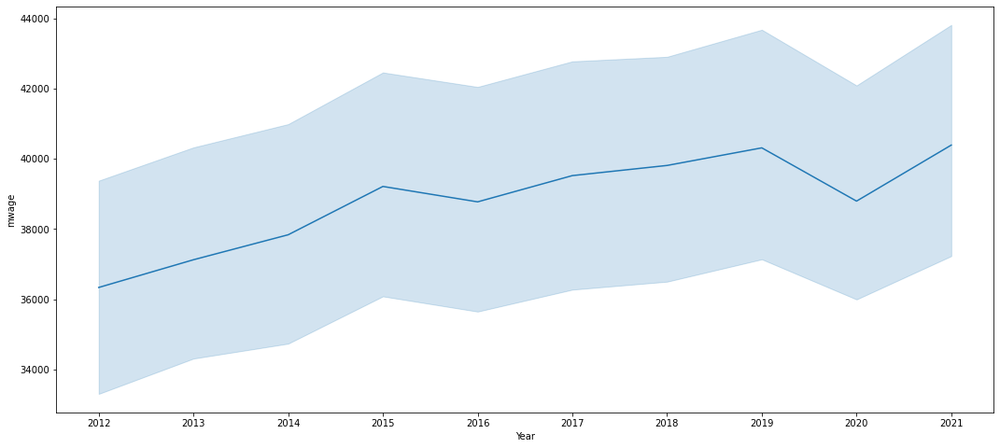

In [125]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

- Beginning in 2012, the trend was upward and continued to rise through 2014.
- The trend peaked in 2015 before declining in 2016.
- Similar to the motion in 2012, the trend was higher.
- As 2020 approached, the trend declined in 2019. However, it increased later, in 2021.

In [128]:
plotHeatmap(df2,'area')

`Description`

- From the first 3 areas, Northumb in 2012 had the highest wages, followed by Durham (County), and Cumbria had the highest minimum wages over the years .

- We can also see Northumb in 2012 had high wages but declined as the years pass by till after 2020 where it took up again.
- From the first 3 areas, Staffordshire  and Merseyside (Met County) had the lowest minimum wages over the years.

- Wiltshire, Hertfordshire, and are continuosly increasing the minimum wage over the years.

In [135]:
np.argmax(df2['mwage'])

14020

In [136]:
df2.iloc[14020]

area     Outer London
Year             2017
mwage        850000.0
Name: 14020, dtype: object

Minimum Wage Distribution

In [137]:
# plotBoxplot(df2, 'area')

`Conclusion`

- 

- Over the years aside Great Britain, the rest of the country's Minimum wage distribution hasn't changed.

In [131]:
import plotly.express as px
fig = px.box(df2, x="mwage", y="area", points="all")
fig.show()

In [ ]:
plt.

In [246]:
# data for year 2020
df3 = df2[df2.Year == '2020_pay']

#sorting values with mwage
df3 = df3.sort_values('mwage', ascending = False)


In [247]:
df3

,area,Year,mwage


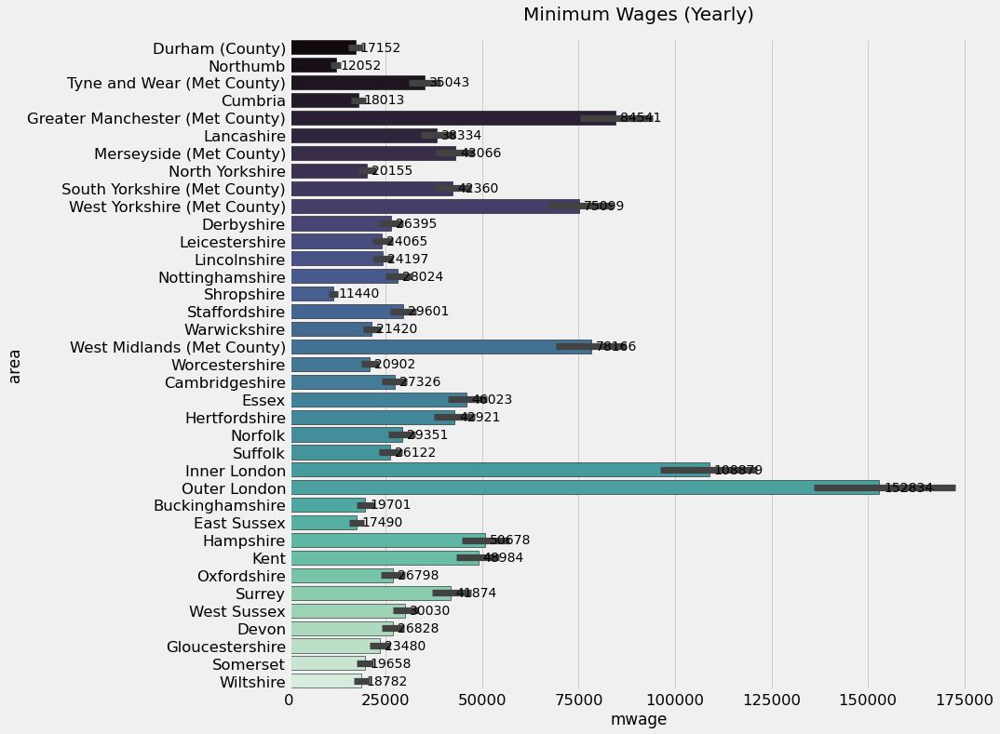

In [248]:
plotBarplot(df2, 'area')

In [249]:
# import

In [250]:
# labels = df3['area'].value_counts().index
# sizes = df3['area'].value_counts()

# plt.figure(figsize = (20,8))
# plt.pie(sizes, labels=labels, autopct='%1.1f%%')
# plt.tight_layout()
# plt.title('Minimum wages (Yearly)',color = 'black',fontsize = 15)

import plotly.express as px

# # df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
# # df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
# fig = px.pie(df3, values='mwage', names='area', title='Minimum wages (Yearly)')
# # fig = px.pie(df3, values='pop', names='country', title='Population of European continent')
# fig.show()

plotPie(df2, x='area', y='mwage',t='2020')

On here we were concerned about the areas and their minimum wages.



#### Has the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK?

# BEFORE

### To investigate the relationship on the hourly pay before and after the COVID-19 Pandemic in annual survey of hours and earnings



In [251]:
uk_area_years_df =uk_df.set_index('area')
uk_area_years_df = uk_area_years_df.drop(index=(uk)).reset_index()
uk_area_years_df.head()


,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,Durham (County),England,ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
1,Northumb,England,ecounty,Male,basic,Full Time,Weekly,49000.0,6.0,48000.0,...,47000.0,6.3,49000.0,6.3,45000.0,6.6,41000.0,8.0,45000.0,7.4
2,Tyne and Wear (Met County),England,ecounty,Male,basic,Full Time,Weekly,182000.0,3.0,179000.0,...,184000.0,3.2,181000.0,3.2,180000.0,3.2,172000.0,3.8,174000.0,3.8
3,Cumbria,England,ecounty,Male,basic,Full Time,Weekly,87000.0,4.5,86000.0,...,88000.0,4.6,91000.0,4.5,95000.0,4.5,93000.0,5.2,97000.0,5.0
4,Greater Manchester (Met County),England,ecounty,Male,basic,Full Time,Weekly,405000.0,2.0,412000.0,...,446000.0,2.0,441000.0,2.0,457000.0,2.0,395000.0,2.5,417000.0,2.4


In [252]:
uk_area_years_df[['work_standard', 'work_time','2020_pay']][:10]

,work_standard,work_time,2020_pay
0,Full Time,Weekly,76000.0
1,Full Time,Weekly,41000.0
2,Full Time,Weekly,172000.0
3,Full Time,Weekly,93000.0
4,Full Time,Weekly,395000.0
5,Full Time,Weekly,183000.0
6,Full Time,Weekly,196000.0
7,Full Time,Weekly,101000.0
8,Full Time,Weekly,212000.0
9,Full Time,Weekly,381000.0


In [253]:
uk_area_years_df['work_standard'].unique()

array(['Full Time', 'Part Time'], dtype=object)

In [254]:
by_worktime = uk_area_years_df.groupby(["work_time",'work_standard'])

In [255]:
for state, frame in by_worktime:
    print(f"First 2 entries for {state!r}")
    print("------------------------")
    print(frame.head(2), end="\n\n")

First 2 entries for ('Hourly', 'Full Time')
------------------------
               area    state area_type   sex pay_standard work_standard  \
37  Durham (County)  England   ecounty  Male        gross     Full Time   
38         Northumb  England   ecounty  Male        gross     Full Time   

   work_time  2012_pay  2012_conf%  2013_pay  ...  2017_pay  2017_conf%  \
37    Hourly   84000.0         4.5   81000.0  ...   85000.0         4.6   
38    Hourly   49000.0         6.0   48000.0  ...   47000.0         6.3   

    2018_pay  2018_conf%  2019_pay  2019_conf%  2020_pay  2020_conf%  \
37   90000.0         4.6   92000.0         4.6   76000.0         5.8   
38   49000.0         6.3   45000.0         6.6   41000.0         8.0   

    2021_pay  2021_conf%  
37   88000.0         5.5  
38   45000.0         7.4  

[2 rows x 27 columns]

First 2 entries for ('Hourly', 'Part Time')
------------------------
                area    state area_type   sex pay_standard work_standard  \
783  Durham 

In [256]:
['Full Time', 'Part Time']

['Full Time', 'Part Time']

'Full Time'

In [257]:

# drill down to the sub-table
fulltimehourly_df = by_worktime.get_group(("Hourly",'Full Time'))
fulltimehourly_df.head()

,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
37,Durham (County),England,ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
38,Northumb,England,ecounty,Male,gross,Full Time,Hourly,49000.0,6.0,48000.0,...,47000.0,6.3,49000.0,6.3,45000.0,6.6,41000.0,8.0,45000.0,7.4
39,Tyne and Wear (Met County),England,ecounty,Male,gross,Full Time,Hourly,182000.0,3.0,179000.0,...,184000.0,3.2,181000.0,3.2,180000.0,3.2,172000.0,3.8,174000.0,3.8
40,Cumbria,England,ecounty,Male,gross,Full Time,Hourly,87000.0,4.5,86000.0,...,88000.0,4.6,91000.0,4.5,95000.0,4.5,93000.0,5.2,97000.0,5.0
41,Greater Manchester (Met County),England,ecounty,Male,gross,Full Time,Hourly,405000.0,2.0,412000.0,...,446000.0,2.0,441000.0,2.0,457000.0,2.0,395000.0,2.5,417000.0,2.4


In [258]:
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
fulltimehourly_area_df = fulltimehourly_df[plot_col_pay]

In [259]:
fulltimehourly_area_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
37,Durham (County),84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
38,Northumb,49000.0,48000.0,47000.0,45000.0,46000.0,47000.0,49000.0,45000.0,41000.0,45000.0
39,Tyne and Wear (Met County),182000.0,179000.0,181000.0,191000.0,183000.0,184000.0,181000.0,180000.0,172000.0,174000.0
40,Cumbria,87000.0,86000.0,85000.0,89000.0,89000.0,88000.0,91000.0,95000.0,93000.0,97000.0
41,Greater Manchester (Met County),405000.0,412000.0,421000.0,427000.0,429000.0,446000.0,441000.0,457000.0,395000.0,417000.0
...,...,...,...,...,...,...,...,...,...,...,...
1997,Surrey,17.7,17.12,17.38,17.69,18.28,18.69,19.46,19.89,20.4,20.32
1998,West Sussex,13.64,13.74,13.77,14.23,14.69,14.55,15.35,16.54,15.84,17.01
1999,Devon,11.87,11.62,12.37,12.63,13.0,13.5,13.67,14.71,15.27,15.45
2000,Somerset,12.69,13.11,12.88,13.17,13.33,13.36,13.54,14.89,14.95,15.63


In [260]:
df2= fulltimehourly_area_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")


In [261]:
df2.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [262]:
plotHeatmap(df2, 'area')

`Description`

- From the first 3 areas, Northumb , followed by Durham (County), and Cumbria had the highest minimum wages over the years .

- We can also see Northumb in 2012 had high wages but declined as the years pass by till after 2020 where it took up again.
- From the first 3 areas, Staffordshire  and Merseyside (Met County) had the lowest minimum wages over the years.

- Wiltshire, Hertfordshire, and are continuosly increasing the minimum wage over the years.

Minimum Wage Distribution

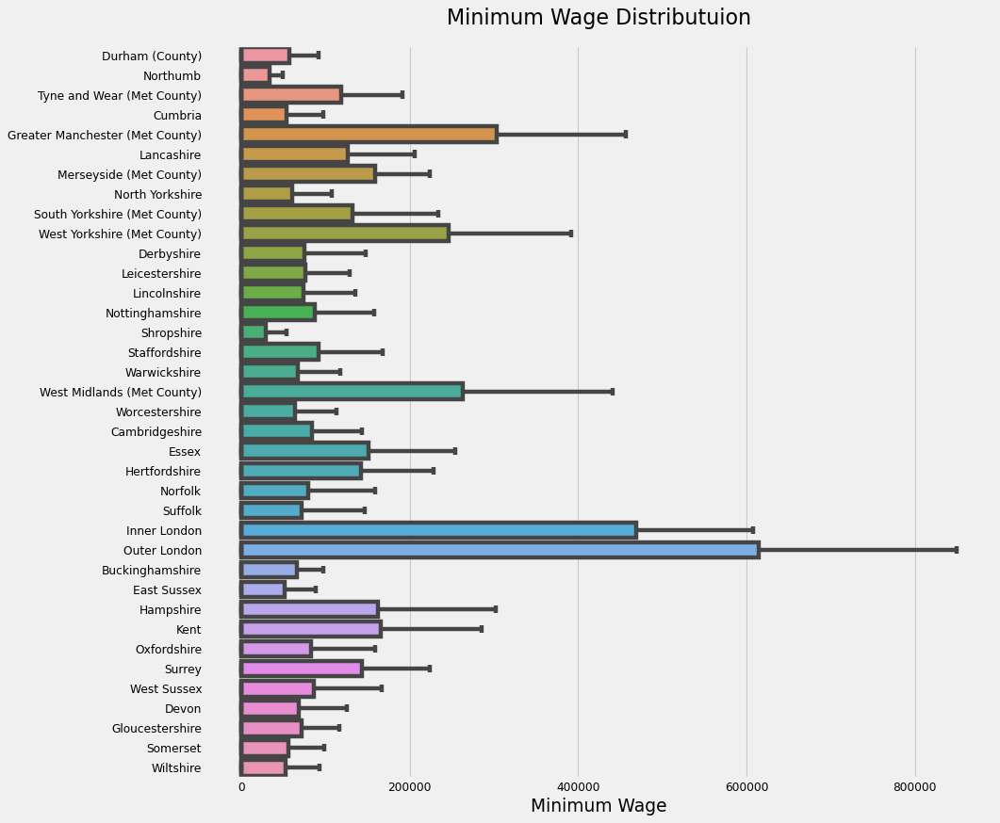

In [263]:
plotBoxplot(df2, 'area')

In [264]:
import plotly.express as px
# df = px.data.tips()
fig = px.box(df2, points="all")
fig.show()

In [265]:
plotPie(df2, 'area', 'mwage', '2012-2021')

'Part Time'

In [266]:
# drill down to the sub-table
parttimehourly_df = by_worktime.get_group(("Hourly",'Part Time'))
parttimehourly_df.head()

,area,state,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
783,Durham (County),England,ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3
784,Northumb,England,ecounty,Male,gross,Part Time,Hourly,7000.0,15.4,8000.0,...,7000.0,15.5,9000.0,14.1,7000.0,16.4,8000.0,17.4,8000.0,17.0
785,Tyne and Wear (Met County),England,ecounty,Male,gross,Part Time,Hourly,27000.0,7.7,29000.0,...,34000.0,6.9,30000.0,7.5,33000.0,7.1,29000.0,9.2,32000.0,8.6
786,Cumbria,England,ecounty,Male,gross,Part Time,Hourly,14000.0,10.6,14000.0,...,15000.0,10.5,14000.0,10.9,14000.0,11.0,13000.0,13.9,14000.0,13.2
787,Greater Manchester (Met County),England,ecounty,Male,gross,Part Time,Hourly,77000.0,4.6,74000.0,...,78000.0,4.5,80000.0,4.6,80000.0,4.6,78000.0,5.5,83000.0,5.2


In [267]:
plot_col_pay = ['area', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']
parttime_area_hourly_df = parttimehourly_df[plot_col_pay]

In [268]:
parttime_area_hourly_df

,area,2012_pay,2013_pay,2014_pay,2015_pay,2016_pay,2017_pay,2018_pay,2019_pay,2020_pay,2021_pay
783,Durham (County),14000.0,12000.0,11000.0,12000.0,12000.0,12000.0,13000.0,13000.0,12000.0,14000.0
784,Northumb,7000.0,8000.0,7000.0,8000.0,7000.0,7000.0,9000.0,7000.0,8000.0,8000.0
785,Tyne and Wear (Met County),27000.0,29000.0,34000.0,31000.0,31000.0,34000.0,30000.0,33000.0,29000.0,32000.0
786,Cumbria,14000.0,14000.0,14000.0,15000.0,13000.0,15000.0,14000.0,14000.0,13000.0,14000.0
787,Greater Manchester (Met County),77000.0,74000.0,82000.0,78000.0,77000.0,78000.0,80000.0,80000.0,78000.0,83000.0
...,...,...,...,...,...,...,...,...,...,...,...
2712,West Sussex,11.11,11.49,11.86,11.89,12.14,12.6,12.78,13.78,14.43,14.24
2713,Devon,11.14,11.5,11.72,11.54,11.96,12.39,12.6,12.74,13.34,13.82
2714,Gloucestershire,11.19,11.24,11.4,11.34,12.11,11.93,12.33,13.05,13.68,13.46
2715,Somerset,10.16,10.08,10.27,10.13,10.61,11.11,11.76,12.29,12.71,13.34


In [269]:
df2= parttime_area_hourly_df.melt(id_vars=["area"],
        var_name="Year", 
        value_name="mwage")


In [270]:
df2.area.unique()

array(['Durham (County)', 'Northumb', 'Tyne and Wear (Met County)',
       'Cumbria', 'Greater Manchester (Met County)', 'Lancashire',
       'Merseyside (Met County)', 'North Yorkshire',
       'South Yorkshire (Met County)', 'West Yorkshire (Met County)',
       'Derbyshire', 'Leicestershire', 'Lincolnshire', 'Nottinghamshire',
       'Shropshire', 'Staffordshire', 'Warwickshire',
       'West Midlands (Met County)', 'Worcestershire', 'Cambridgeshire',
       'Essex', 'Hertfordshire', 'Norfolk', 'Suffolk', 'Inner London',
       'Outer London', 'Buckinghamshire', 'East Sussex', 'Hampshire',
       'Kent', 'Oxfordshire', 'Surrey', 'West Sussex', 'Devon',
       'Gloucestershire', 'Somerset', 'Wiltshire'], dtype=object)

In [271]:
plotHeatmap(df2, 'area')

`Description`

- From the first 3 areas, Northumb , followed by Durham (County), and Cumbria had the highest minimum wages over the years .

- We can also see Northumb in 2012 had high wages but declined as the years pass by till after 2020 where it took up again.
- From the first 3 areas, Staffordshire  and Merseyside (Met County) had the lowest minimum wages over the years.

- Wiltshire, Hertfordshire, and are continuosly increasing the minimum wage over the years.

Minimum Wage Distribution

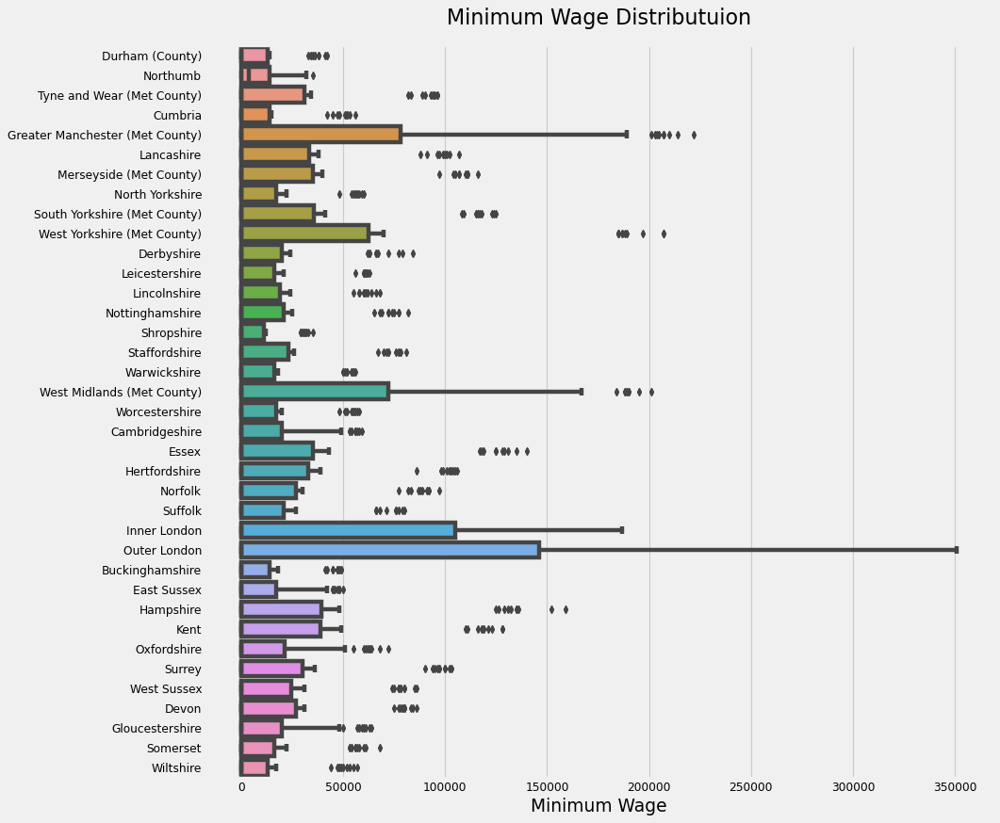

In [272]:
plotBoxplot(df2, 'area')

In [273]:
import plotly.express as px
# df = px.data.tips()
fig = px.box(df2, points="all")
fig.show()

In [274]:
plotPie(df2, 'area', 'mwage','2012-2021')

### END OF FULL DATA EDA --AREA

# Can we compare the hourly pay of part time and full-time workers in the UK, before and after the COVID 19 pandemic?

### Here we focus on the UK, i.e  England ,  Wales ,  Scotland ,  Northern Ireland 

## START state

Here we focused on the state using the area

In [285]:
uk_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3116,England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
3117,England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
3118,England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
3119,England,Hampshire,ecounty,Female,overtime,Part Time,Hours,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


In [290]:
uk_state_years_df =uk_df.copy()#.set_index('state')
# uk_state_years_df = uk_state_years_df.drop(index=(uk)).reset_index()
uk_state_years_df.head()


,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [291]:
by_worktime = uk_state_years_df.groupby(["work_time",'work_standard'])

In [292]:
for state, frame in by_worktime:
    print(f"First 2 entries for {state!r}")
    print("------------------------")
    print(frame.head(2), end="\n\n")

First 2 entries for ('Hourly', 'Full Time')
------------------------
      state     area area_type   sex pay_standard work_standard work_time  \
41  England  England   country  Male        gross     Full Time    Hourly   
42    Wales    Wales   country  Male        gross     Full Time    Hourly   

     2012_pay  2012_conf%   2013_pay  ...   2017_pay  2017_conf%   2018_pay  \
41  8778000.0         0.2  8895000.0  ...  9502000.0         0.2  9483000.0   
42   466000.0         1.9   473000.0  ...   487000.0         1.9   489000.0   

    2018_conf%   2019_pay  2019_conf%   2020_pay  2020_conf%   2021_pay  \
41         0.2  9508000.0         0.2  9117000.0         0.3  9570000.0   
42         1.9   492000.0         1.9   484000.0         2.2   504000.0   

    2021_conf%  
41         0.3  
42         2.2  

[2 rows x 27 columns]

First 2 entries for ('Hourly', 'Part Time')
------------------------
       state     area area_type   sex pay_standard work_standard work_time  \
870  England 

'Full Time'

In [293]:

# drill down to the sub-table
fulltimehourly_df = by_worktime.get_group(("Hourly",'Full Time'))
fulltimehourly_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
41,England,England,country,Male,gross,Full Time,Hourly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
42,Wales,Wales,country,Male,gross,Full Time,Hourly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
43,Scotland,Scotland,country,Male,gross,Full Time,Hourly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
44,Northern Ireland,Northern Ireland,country,Male,gross,Full Time,Hourly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
45,England,Durham (County),ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [307]:

# drill down to the sub-table
# For Parttime
parttimehourly_df = by_worktime.get_group(("Hourly",'Part Time'))
parttimehourly_df.head()


,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
870,England,England,country,Male,gross,Part Time,Hourly,1405000.0,1.0,1418000.0,...,1533000.0,0.9,1619000.0,0.9,1608000.0,0.9,1615000.0,1.1,1664000.0,1.1
871,Wales,Wales,country,Male,gross,Part Time,Hourly,74000.0,4.7,68000.0,...,76000.0,4.6,88000.0,4.4,85000.0,4.5,78000.0,5.5,88000.0,5.0
872,Scotland,Scotland,country,Male,gross,Part Time,Hourly,143000.0,3.3,136000.0,...,148000.0,3.3,165000.0,3.2,159000.0,3.2,146000.0,4.0,149000.0,3.8
873,Northern Ireland,Northern Ireland,country,Male,gross,Part Time,Hourly,64000.0,5.1,55000.0,...,64000.0,5.1,64000.0,5.1,67000.0,5.1,81000.0,5.4,83000.0,5.2
874,England,Durham (County),ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3


## 2012 to 2019

'Full Time'

In [296]:
# desired years
plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay']

fulltime_state_uk_hourly_df = fulltimehourly_df[plot_col_pay]

In [297]:
fulltime_state_uk_hourly_df['state'].unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

In [298]:
df2= fulltime_state_uk_hourly_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))
df2

,state,Year,mwage
0,England,2012-01-01,8778000.0
1,Wales,2012-01-01,466000.0
2,Scotland,2012-01-01,907000.0
3,Northern Ireland,2012-01-01,306000.0
4,England,2012-01-01,84000.0
...,...,...,...
3915,England,2019-01-01,19.89
3916,England,2019-01-01,16.54
3917,England,2019-01-01,14.71
3918,England,2019-01-01,14.89


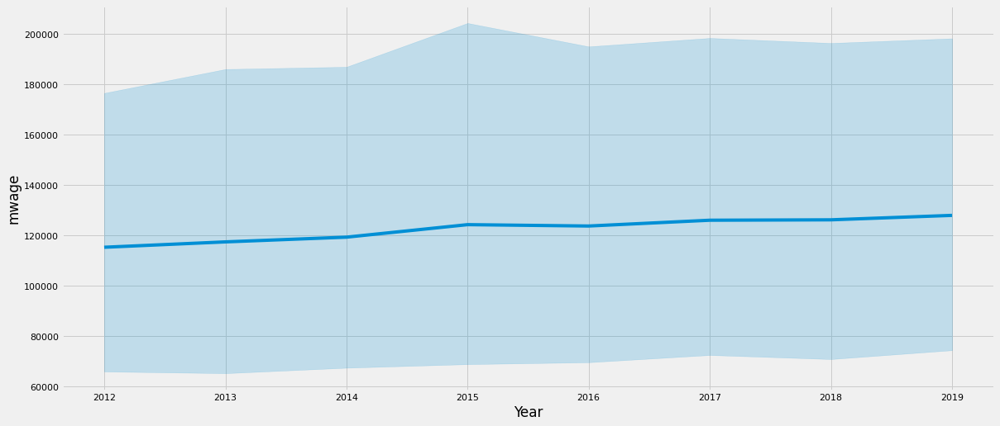

In [299]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

From 2012, the minimum wages went high up at 2015.

It then went up at 2015 and then kept the pace to 2019.

In [300]:
plotHeatmap(df2, 'state')

`Description`

- England, followed by Scotland, had the highest minimum wages among the first two states over the years.

- Northern Ireland and Wales had the lowest minimum wages among the other states over the years.

- Wages in England fell in 2013 before rising again in 2014.

- Prior to covid(2020), Wales' minimum wage in 2019 was higher than that of Northern Ireland, a trend that would last until the next year.

- The minimum wage in England and Scotland has steadily increased over the years.

Minimum Wage Distribution

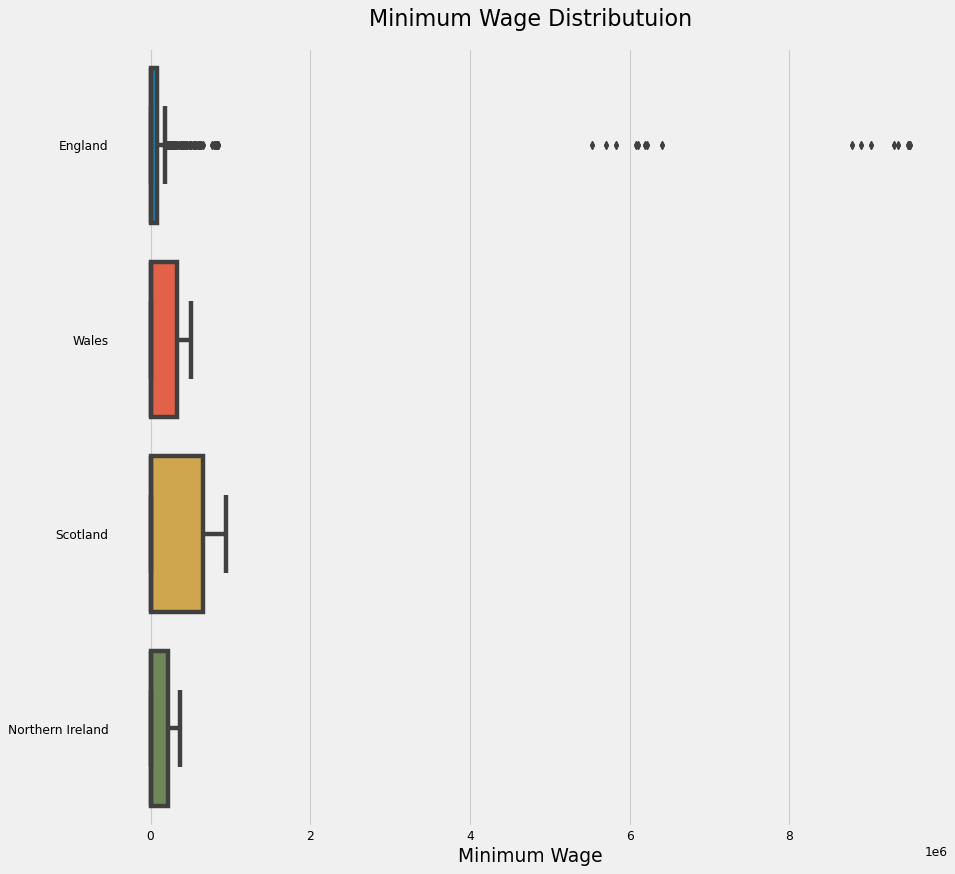

In [301]:
plotBoxplot(df2, 'state')

In [302]:
plotPie(df, 'state','mwage')

### 'Part Time'

In [304]:
# # drill down to the sub-table
# parttime_uk_hourly_df = by_worktime.get_group(("Hourly",'Part Time'))
# parttime_uk_hourly_df.head()

In [306]:
# fulltimehourly_df
# parttimehourly_df

In [308]:
# desired years

plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay']
parttime_uk_hourly_df = parttimehourly_df[plot_col_pay]

In [309]:
df2= parttime_uk_hourly_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
df2['Year'] = pd.to_datetime(df2['Year'].apply(lambda x: x.split('_')[0]))
df2

,state,Year,mwage
0,England,2012-01-01,1405000.0
1,Wales,2012-01-01,74000.0
2,Scotland,2012-01-01,143000.0
3,Northern Ireland,2012-01-01,64000.0
4,England,2012-01-01,14000.0
...,...,...,...
3819,England,2019-01-01,13.78
3820,England,2019-01-01,12.74
3821,England,2019-01-01,13.05
3822,England,2019-01-01,12.29


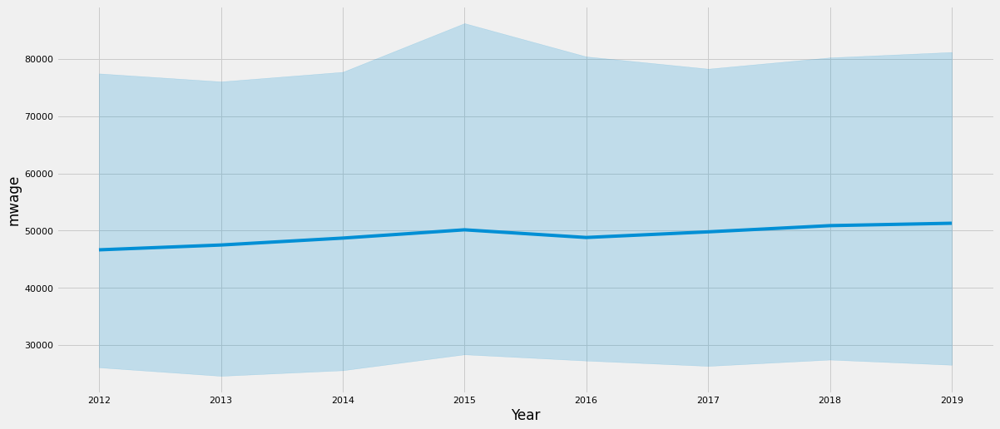

In [310]:
plt.figure(figsize=(18,8))

sns.lineplot(x='Year',y='mwage',data=df2)
plt.show()

`Description`

From 2012, the minimum wages went high up at 2015.

It then went up at 2015 and then kept the pace to 2019.

In [311]:
plotHeatmap(df2, 'state')

`Description`

- England, followed by Scotland, had the highest minimum wages among the first two states over the years.

- Northern Ireland and Wales had the lowest minimum wages among the other states over the years.

- Wages in England fell in 2013 before rising again in 2014.

- Prior to covid(2020), Wales' minimum wage in 2019 was higher than that of Northern Ireland, a trend that would last until the next year.

- The minimum wage in England and Scotland has steadily increased over the years.

Minimum Wage Distribution

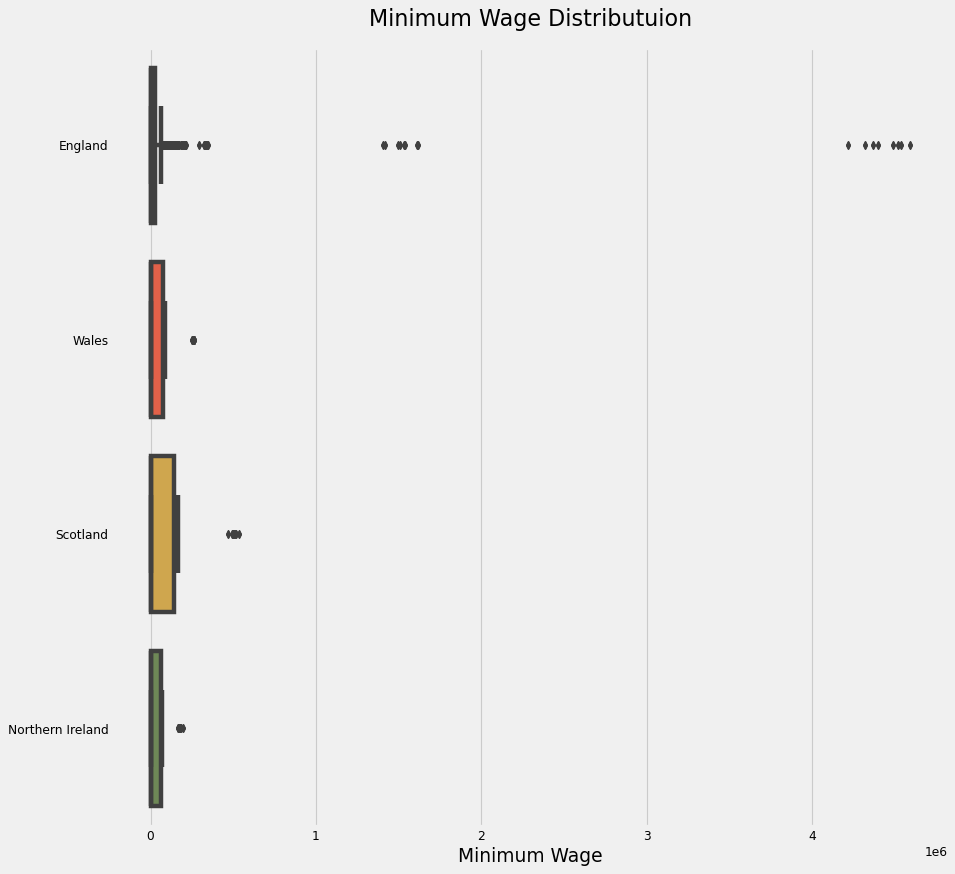

In [312]:
plotBoxplot(df2, 'state')

In [313]:
plotPie(df, 'state','mwage')

In [314]:
# import plotly.express as px

# # df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
# # df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
# fig = px.pie(df2, values='mwage', names='state', title='Minimum wages (Yearly)')
# # fig = px.pie(df3, values='pop', names='country', title='Population of European continent')
# fig.show()

# During covid

## focus on 2020

"Full Time"

In [315]:
fulltimehourly_df.state.unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

Confidence Interval (CI) provides us with a range of values that we are fairly sure will include the true population value, such as a mean or proportion.

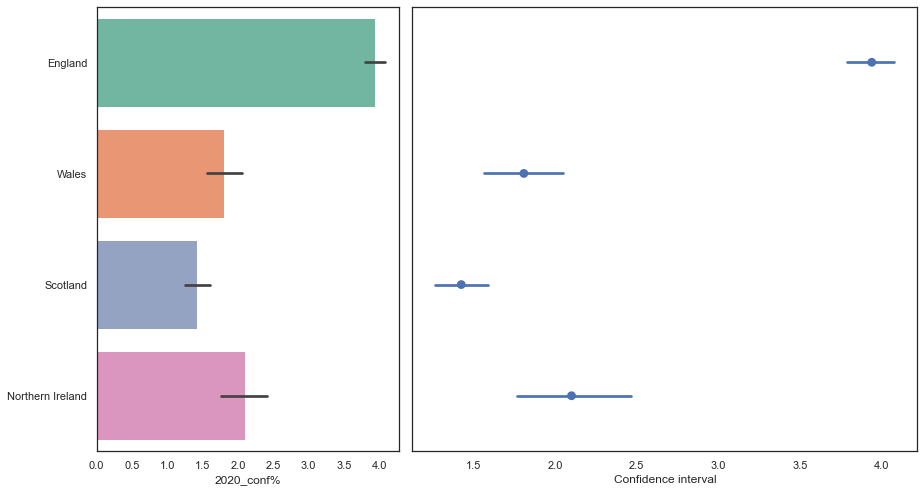

In [316]:
plotBarplotPointPlot(fulltimehourly_df, '2020_conf%', 'state')

`Description`

- From the 4 states, England had the highest confidence interval in 2020, followed by the Northern Ireland, Wales and Scotland in that order.

- Northern Ireland interval was very close to that of Wales.

In [317]:
hourly_state_df = fulltimehourly_df[['state', '2020_pay',]]

In [318]:
hourly_state_df

,state,2020_pay
41,England,9117000.0
42,Wales,484000.0
43,Scotland,859000.0
44,Northern Ireland,414000.0
45,England,76000.0
...,...,...
2225,England,20.4
2226,England,15.84
2227,England,15.27
2228,England,14.95


In [319]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")
df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [320]:
plotHeatmap(df2, 'state')

`Description`

- England had the highest pay in 2020. Next was Scotland , followed by Wales then the Northern Ireland.

Minimum Wage Distribution

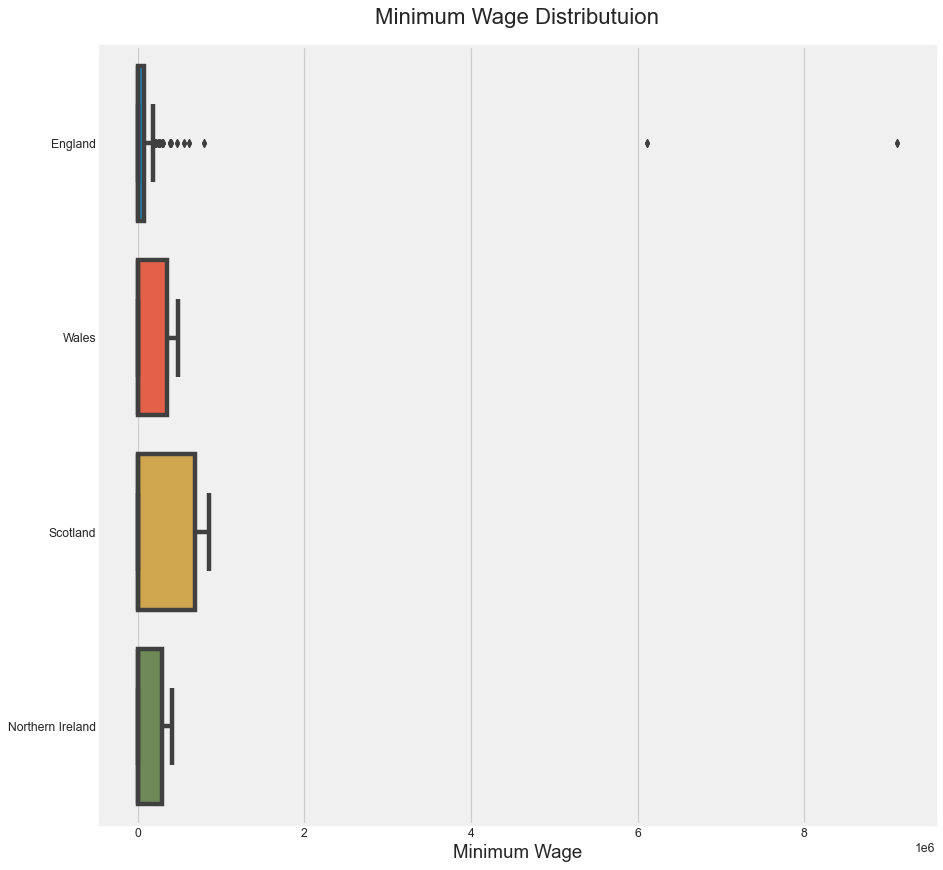

In [321]:
plotBoxplot(df2, 'state')

In [322]:
plotPie(df2, 'state','mwage')

In [323]:
df2.columns

Index(['state', 'Year', 'mwage'], dtype='object')

In [324]:
df2

,state,Year,mwage
0,England,2020,9117000.0
1,Wales,2020,484000.0
2,Scotland,2020,859000.0
3,Northern Ireland,2020,414000.0
4,England,2020,76000.0
...,...,...,...
485,England,2020,20.4
486,England,2020,15.84
487,England,2020,15.27
488,England,2020,14.95


In [325]:
# # # data for year 2020
# # df3 = df2[df2.Year == '2020_pay']

# # #sorting values with mwage
# # df3 = df3.sort_values('mwage', ascending = False)
# import plotly.express as px

# # df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
# fig = px.pie(df2, values='mwage', names='state', title='Minimum wages (Yearly) | 2020')
# # fig = px.pie(df3, values='pop', names='country', title='Population of European continent')
# fig.show()

"part Time"

In [326]:
parttimehourly_df.state.unique()

array(['England', 'Wales', 'Scotland', 'Northern Ireland'], dtype=object)

Confidence Interval (CI) provides us with a range of values that we are fairly sure will include the true population value, such as a mean or proportion.

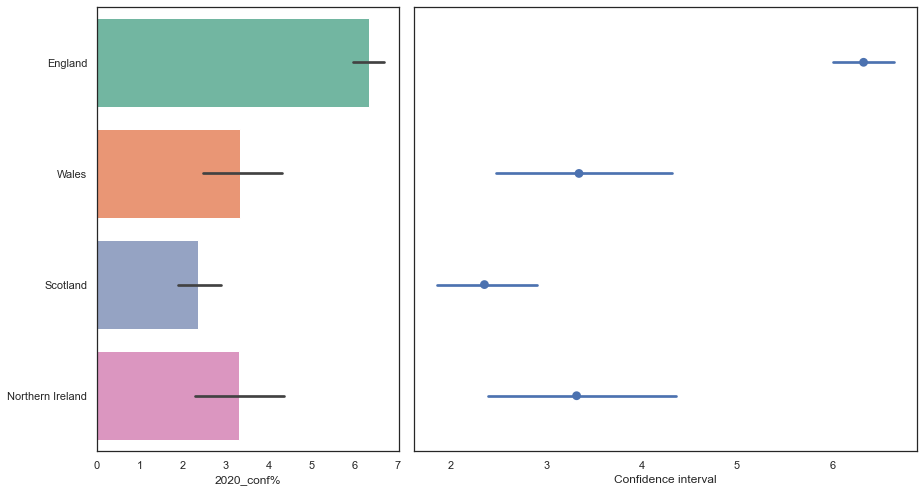

In [327]:
plotBarplotPointPlot(parttimehourly_df, '2020_conf%', 'state')

`Description`

- From the 4 states, England had the highest confidence interval in 2020, followed by the Northern Ireland, Wales and Scotland in that order.

- Northern Ireland interval was very close to that of Wales.

In [328]:
hourly_state_df = parttimehourly_df[['state', '2020_pay',]]

In [329]:
hourly_state_df

,state,2020_pay
870,England,1615000.0
871,Wales,78000.0
872,Scotland,146000.0
873,Northern Ireland,81000.0
874,England,12000.0
...,...,...
3022,England,14.43
3023,England,13.34
3024,England,13.68
3025,England,12.71


In [330]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")
df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [331]:
plotHeatmap(df2, 'state')

`Description`

- England had the highest pay in 2020. Next was Scotland , followed by Wales then the Northern Ireland.

Minimum Wage Distribution

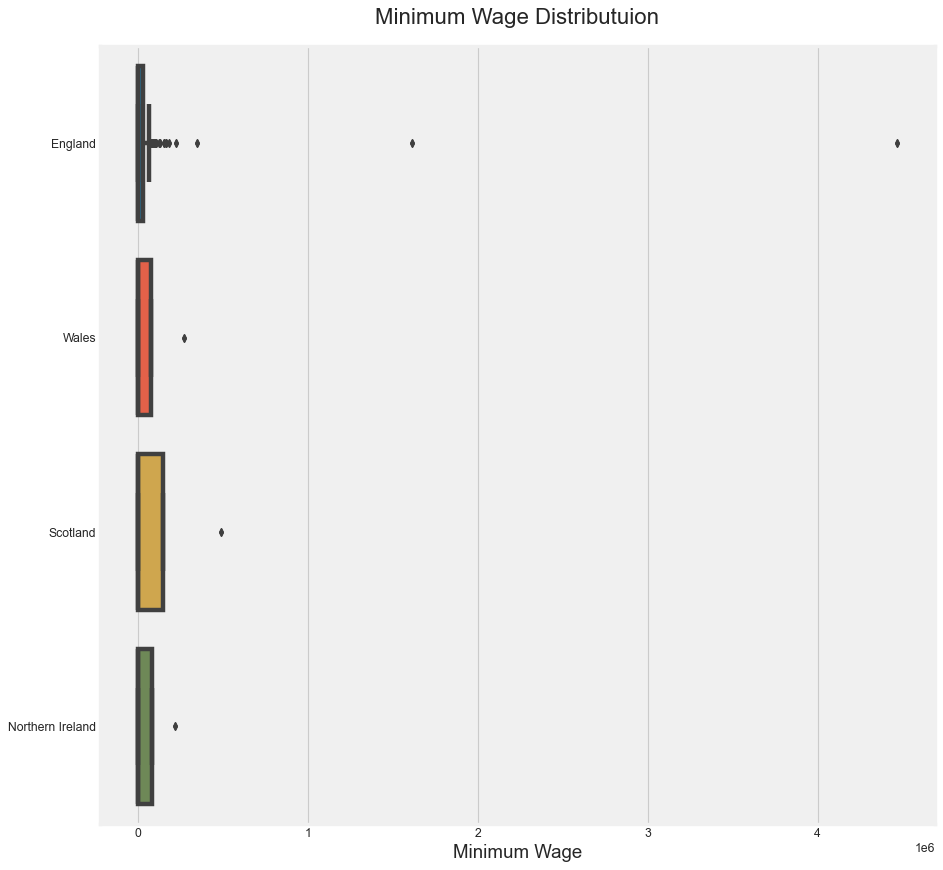

In [332]:
plotBoxplot(df2, 'state')

In [333]:
plotPie(df2, 'state','mwage')

### 2021

## After covid

focus on 2021

'Full Time'

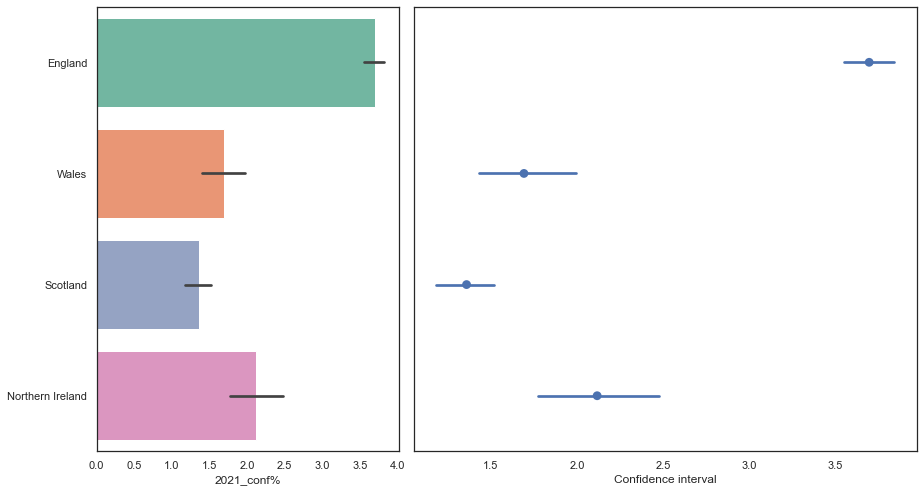

In [334]:
plotBarplotPointPlot(fulltimehourly_df, '2021_conf%', 'state')

`Description`

- England had the highest confidence interval of the four states, giving us a more precise idea of the range of values that could contain the true population mean in 2021. Then, in that order, Northern Ireland, Wales, and Scotland.

In [335]:
# plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
#        '2018_pay', '2019_pay', '2020_pay', '2021_pay']

hourly_state_df = fulltimehourly_df[['state', '2021_pay',]]

In [336]:
hourly_state_df

,state,2021_pay
41,England,9570000.0
42,Wales,504000.0
43,Scotland,906000.0
44,Northern Ireland,448000.0
45,England,88000.0
...,...,...
2225,England,20.32
2226,England,17.01
2227,England,15.45
2228,England,15.63


In [997]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [998]:
plotHeatmap(df2, 'state')

`Description`

- From the 4 states, England , followed by Scotland, Northern Ireland ,and Wales had the highest minimum wages in 2020.

- From the plot, we can also see England surpassed Scotland with a difference of 0.05.

- We could also see that Northern Ireland surpassed waleswith a difference of 0.11 which we can see from the confidence interval.

- England and Scotland are continuosly increasing the minimum wage over the years.

Minimum Wage Distribution

In [347]:
# plotBoxplot(df2, 'state')

In [348]:
# # data for year 2021
# df3 = df2[df2.Year == '2021_pay']

# #sorting values with mwage
# df3 = df3.sort_values('mwage', ascending = False)


<Figure size 1296x576 with 0 Axes>

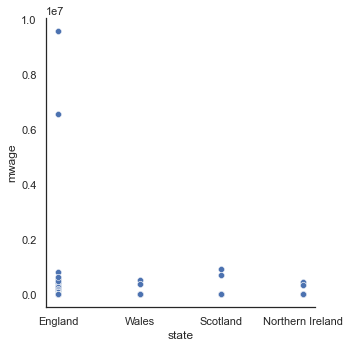

In [349]:
plt.figure(figsize=(18,8))
sns.relplot(x='state',y='mwage',data=df2)
plt.show()

In [351]:
plotPie(df, 'state','mwage','2021')

This graphic shows the distribution of samples according to their yearly Minimum wages in the UK.

'Part Time'

In [352]:
parttimehourly_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
870,England,England,country,Male,gross,Part Time,Hourly,1405000.0,1.0,1418000.0,...,1533000.0,0.9,1619000.0,0.9,1608000.0,0.9,1615000.0,1.1,1664000.0,1.1
871,Wales,Wales,country,Male,gross,Part Time,Hourly,74000.0,4.7,68000.0,...,76000.0,4.6,88000.0,4.4,85000.0,4.5,78000.0,5.5,88000.0,5.0
872,Scotland,Scotland,country,Male,gross,Part Time,Hourly,143000.0,3.3,136000.0,...,148000.0,3.3,165000.0,3.2,159000.0,3.2,146000.0,4.0,149000.0,3.8
873,Northern Ireland,Northern Ireland,country,Male,gross,Part Time,Hourly,64000.0,5.1,55000.0,...,64000.0,5.1,64000.0,5.1,67000.0,5.1,81000.0,5.4,83000.0,5.2
874,England,Durham (County),ecounty,Male,gross,Part Time,Hourly,14000.0,10.7,12000.0,...,12000.0,12.2,13000.0,11.5,13000.0,11.6,12000.0,14.6,14000.0,13.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3022,England,West Sussex,ecounty,Female,excluding overtime,Part Time,Hourly,11.11,2.6,11.49,...,12.6,2.8,12.78,2.6,13.78,3.3,14.43,3.7,14.24,2.7
3023,England,Devon,ecounty,Female,excluding overtime,Part Time,Hourly,11.14,3.1,11.5,...,12.39,3.4,12.6,3.0,12.74,2.9,13.34,3.4,13.82,3.0
3024,England,Gloucestershire,ecounty,Female,excluding overtime,Part Time,Hourly,11.19,3.2,11.24,...,11.93,2.9,12.33,3.1,13.05,2.9,13.68,4.7,13.46,4.7
3025,England,Somerset,ecounty,Female,excluding overtime,Part Time,Hourly,10.16,3.6,10.08,...,11.11,3.4,11.76,3.7,12.29,2.8,12.71,3.3,13.34,2.8


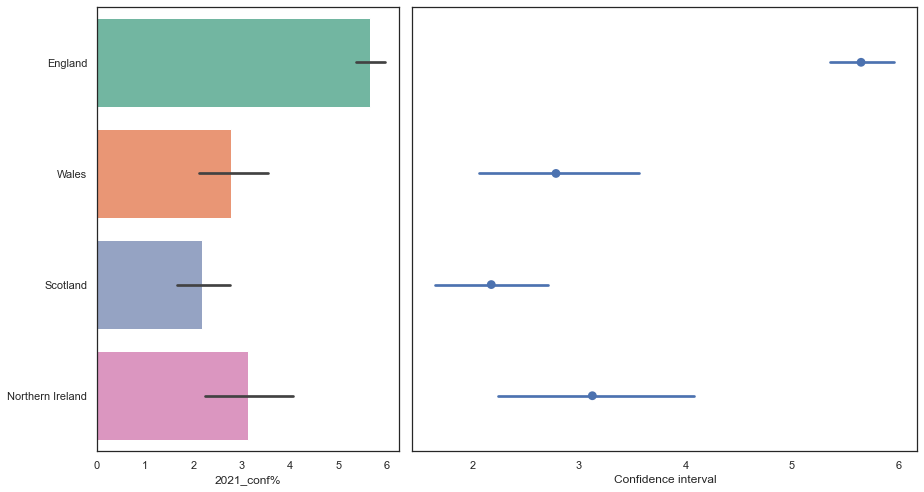

In [353]:
plotBarplotPointPlot(parttimehourly_df, '2021_conf%', 'state')

`Description`

- England had the highest confidence interval of the four states, giving us a more precise idea of the range of values that could contain the true population mean in 2021. Then, in that order, Northern Ireland, Wales, and Scotland.

In [979]:
# plot_col_pay = ['state', '2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
#        '2018_pay', '2019_pay', '2020_pay', '2021_pay']

hourly_state_df = parttimehourly_df[['state', '2021_pay',]]

In [980]:
hourly_state_df

,state,2021_pay
870,England,1664000.0
871,Wales,88000.0
872,Scotland,149000.0
873,Northern Ireland,83000.0
874,England,14000.0
...,...,...
3022,England,14.24
3023,England,13.82
3024,England,13.46
3025,England,13.34


In [981]:
def plot(df,col):
    fig,(ax1,ax2) = plt.subplots(2,1)
    sns.distplot(df[col], ax = ax1)
    sns.boxplot(df[col], ax = ax2)

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



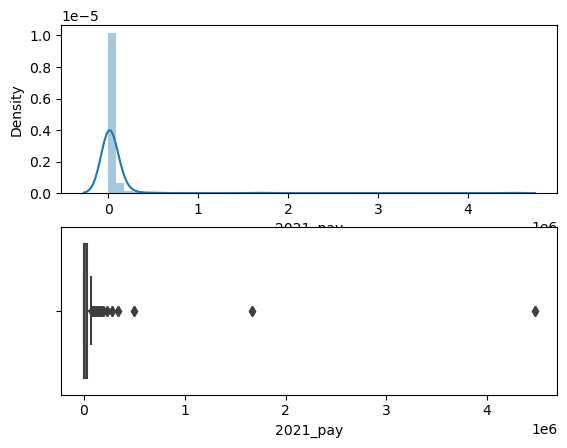

In [982]:
plot(hourly_state_df, "2021_pay")

In [983]:
data = hourly_state_df.copy()

In [984]:
#Replacing outliers with Median
data["UnemploymentRateDecember"]= np.where(data['2021_pay'] >= 0.3,
                            data['2021_pay'].median(), data["2021_pay"])

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



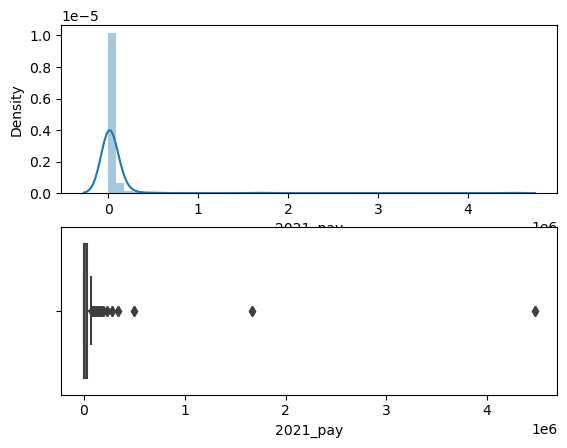

In [985]:
plot(data, "2021_pay")

In [986]:
df2= hourly_state_df.melt(id_vars=["state"],
        var_name="Year", 
        value_name="mwage")

df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])


In [995]:
plotHeatmap(df2, 'state')

`Description`

- From the 4 states, England , followed by Scotland, Northern Ireland ,and Wales had the highest minimum wages in 2020.

- From the plot, we can also see England surpassed Scotland with a difference of 0.05.

- We could also see that Northern Ireland surpassed waleswith a difference of 0.11 which we can see from the confidence interval.

- England and Scotland are continuosly increasing the minimum wage over the years.

Minimum Wage Distribution

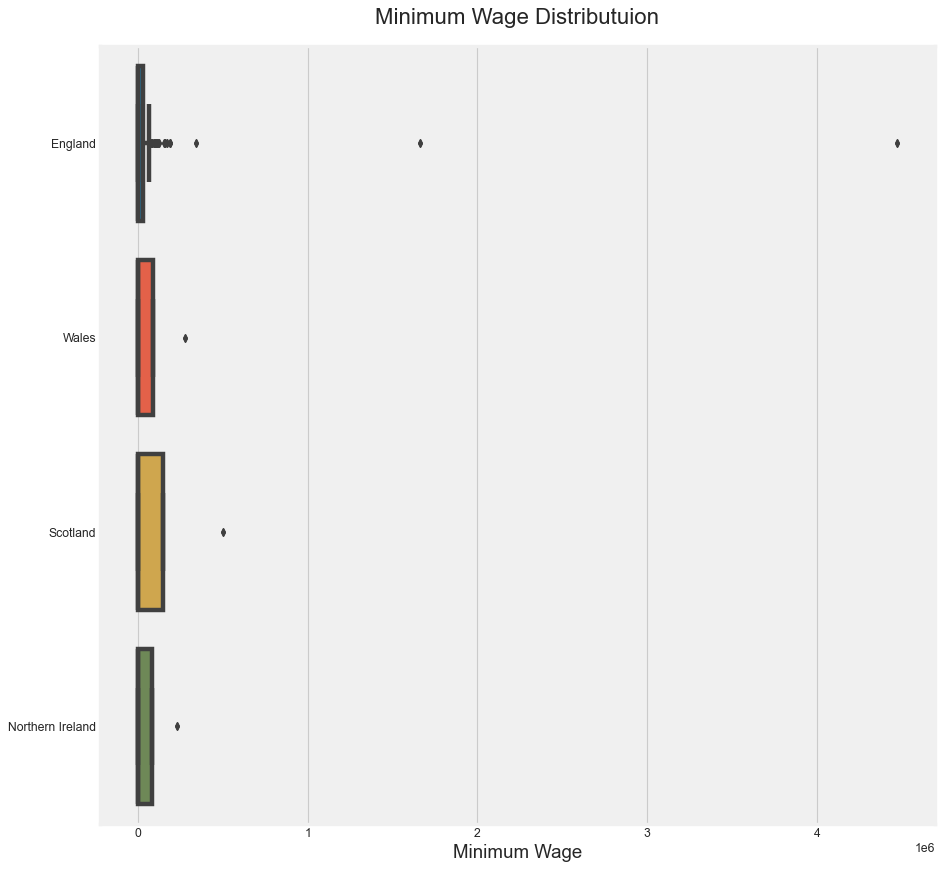

In [365]:
plotBoxplot(df2, 'state')

<Figure size 1296x576 with 0 Axes>

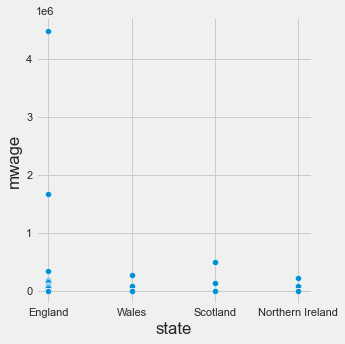

In [366]:
plt.figure(figsize=(18,8))
sns.relplot(x='state',y='mwage',data=df2)
plt.show()

In [367]:
plotPie(df2, 'state','mwage','2021')

This graphic shows the distribution of samples according to their yearly Minimum wages in the UK.

# Has the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK?

 <img src="https://www.machinelearningplus.com/wp-content/uploads/2020/05/800px-Waterfall-chart-min.jpg" />

A waterfall chart, which is a 2D plot, is used to comprehend the effects of adding positive or negative values over time, over a number of steps, or for a variable.

Financial analysis frequently uses waterfall charts to comprehend the gain and loss contributions of various factors over a specific asset. But in our case, we want to know how the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK.

In [376]:
by_all_worktime = uk_state_years_df.groupby(["work_time",])

In [378]:
# drill down to the sub-table
full_part_time_hourly_df = by_all_worktime.get_group("Hourly")
full_part_time_hourly_df.head()

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
41,England,England,country,Male,gross,Full Time,Hourly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
42,Wales,Wales,country,Male,gross,Full Time,Hourly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
43,Scotland,Scotland,country,Male,gross,Full Time,Hourly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
44,Northern Ireland,Northern Ireland,country,Male,gross,Full Time,Hourly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
45,England,Durham (County),ecounty,Male,gross,Full Time,Hourly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5


In [379]:
full_part_time_hourly_df.work_standard.unique()

array(['Full Time', 'Part Time'], dtype=object)

In [380]:
full_part_time_hourly_df.columns

Index(['state', 'area', 'area_type', 'sex', 'pay_standard', 'work_standard',
       'work_time', '2012_pay', '2012_conf%', '2013_pay', '2013_conf%',
       '2014_pay', '2014_conf%', '2015_pay', '2015_conf%', '2016_pay',
       '2016_conf%', '2017_pay', '2017_conf%', '2018_pay', '2018_conf%',
       '2019_pay', '2019_conf%', '2020_pay', '2020_conf%', '2021_pay',
       '2021_conf%'],
      dtype='object')

In [383]:
plot_col_pay = ['2012_pay', '2013_pay', '2014_pay', '2015_pay', '2016_pay', '2017_pay',
       '2018_pay', '2019_pay', '2020_pay', '2021_pay']

waterfall_uk_hourly_df = full_part_time_hourly_df[plot_col_pay]

waterfall_uk_hourly_df.columns = [x.split('_')[0] for x in plot_col_pay]

In [384]:
waterfall_uk_hourly_df

,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
41,8778000.0,8895000.0,9016000.0,9362000.0,9312000.0,9502000.0,9483000.0,9508000.0,9117000.0,9570000.0
42,466000.0,473000.0,479000.0,500000.0,487000.0,487000.0,489000.0,492000.0,484000.0,504000.0
43,907000.0,900000.0,907000.0,931000.0,933000.0,941000.0,949000.0,931000.0,859000.0,906000.0
44,306000.0,279000.0,305000.0,335000.0,354000.0,358000.0,343000.0,368000.0,414000.0,448000.0
45,84000.0,81000.0,84000.0,87000.0,81000.0,85000.0,90000.0,92000.0,76000.0,88000.0
...,...,...,...,...,...,...,...,...,...,...
3022,11.11,11.49,11.86,11.89,12.14,12.6,12.78,13.78,14.43,14.24
3023,11.14,11.5,11.72,11.54,11.96,12.39,12.6,12.74,13.34,13.82
3024,11.19,11.24,11.4,11.34,12.11,11.93,12.33,13.05,13.68,13.46
3025,10.16,10.08,10.27,10.13,10.61,11.11,11.76,12.29,12.71,13.34


In [385]:
# data = waterfall_uk_hourly_df.melt(
#         var_name="year", 
#         value_name="mwage").set_index('year')

# data.head()

data = waterfall_uk_hourly_df.melt(#id_vars=['2012'],
        var_name="year")#.set_index('year')

# df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
data['year'] = pd.to_datetime(data['year'].apply(lambda x: x.split('_')[0]), format='%Y')
data = data.set_index('year')

series = data.copy()

,mwage
year,
2012,8778000.0
2012,466000.0
2012,907000.0
2012,306000.0
2012,84000.0


In [386]:
# # plotting a simple waterfall chart

# fig = go.Figure(go.Waterfall(
#     name = "20", orientation = "v",
# #     measure = ["relative", "relative", "total", "relative", "relative", "total"],
#     measure = ["initial", "relative", "relative", "relative","relative",
#                    "relative", "relative","relative", "relative",  "total"],
#     x = data.columns,
# #     textposition = "outside",
# #     text = ["+60", "+80", "", "-40", "-20", "Total"],
#     y = data.values,
#     connector = {"line":{"color":"rgb(63, 63, 63)"}},
# ))

# fig.update_layout(
#         title = "How the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK",
#         showlegend = True
# )

# fig.show()

In [976]:
# plotting a simple waterfall chart

fig = go.Figure(go.Waterfall(
    name = "20", orientation = "v",
#     measure = ["relative", "relative", "total", "relative", "relative", "total"],
    measure = ["initial", "relative", "relative", "relative","relative",
                   "relative", "relative","relative", "relative",  "total"],
    x = series.index,
#     x = waterfall_uk_hourly_df.columns,
#     textposition = "outside",
#     text = ["+60", "+80", "", "-40", "-20", "Total"],
#     y = waterfall_uk_hourly_df.values,
    y = series.value.values,
    
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
))

fig.update_layout(
        title = "How the pandemic negatively or positively affected the hourly pay of (Part-Time & Full-Time) workers in the UK",
        showlegend = True
)

fig.show()

The first column initial contains the value at the start of the year 2012. Then for each quarter, we can see that the amount has increased. This shows how the sum of each year increase seasonaly.

# modelling

In [852]:
data = waterfall_uk_hourly_df.melt(#id_vars=['2012'],
        var_name="year")#.set_index('year')

# df2['Year'] = df2['Year'].apply(lambda x: x.split('_')[0])
data['year'] = pd.to_datetime(data['year'].apply(lambda x: x.split('_')[0]), format='%Y')
data = data.set_index('year')


In [849]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)


In [757]:
series = data.value.values

# Time Series Prediction with ARIMA

What is time series?¶

    Time series is a collection of data points that are collected at constant time intervals.
    It is time dependent.
    Most of time series have some form of seasonality trends. For example, if we sale ice cream, most probably there will be higher sales in summer seasons. Therefore, this time series has seasonality trends.
    Another example, lets think we dice one time every day during 1 year. As you guess, there will be no scenario like that number six is appeared mostly in summer season or number five is mostly appeared in January. Therefore, this time series does not have seasonality trends.

Stationarity of a Time Series

    There are three basic criterion for a time series to understand whether it is stationary series or not.
    Statistical properties of time series such as mean, variance should remain constant over time to call time series is stationary
    constant mean
    constant variance
    autocovariance that does not depend on time. autocovariance is covariance between time series and lagged time series.

Lets visualize and check seasonality trend of our time series.

In [534]:
data

,value
year,
2012,8778000.0
2012,466000.0
2012,907000.0
2012,306000.0
2012,84000.0
...,...
2021,14.24
2021,13.82
2021,13.46


In [853]:
ts = data.copy()
series = data.copy()

In [844]:
series.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9680 entries, 2012-01-01 to 2021-01-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   value   9680 non-null   object
dtypes: object(1)
memory usage: 151.2+ KB


# From
https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

If you use only the previous values of the time series to predict its future values, it is called Univariate Time Series Forecasting.

In [676]:
ts

,value
year,
2012,8778000.0
2012,466000.0
2012,907000.0
2012,306000.0
2012,84000.0
...,...
2021,14.24
2021,13.82
2021,13.46


Our dataframe is univariate

ARIMA, short for ‘AutoRegressive Integrated Moving Average’, is a forecasting algorithm based on the idea that the information in the past values of the time series can alone be used to predict the future values.

`Notes`

- What does the p, d and q in ARIMA model mean?

    ARIMA model in words:

    Predicted Yt = Constant + Linear combination Lags of Y (upto p lags) + Linear Combination of Lagged forecast errors (upto q lags)
    
    d = is differencing. The purpose of differencing it to make the time series stationary.
  
First, I am going to check if the series is stationary using the Augmented Dickey Fuller test (adfuller()), from the statsmodels package.

Why?


Because, you need differencing only if the series is non-stationary. Else, no differencing is needed, that is, d=0.


The null hypothesis of the ADF test is that the time series is non-stationary. So, if the p-value of the test is less than the significance level (0.05) then you reject the null hypothesis and infer that the time series is indeed stationary.

So, in our case, if P Value > 0.05 we go ahead with finding the order of differencing.

In [677]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(series.value.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -11.476285
p-value: 0.000000


Since P-value is less than the significance level, Hence d=0

<AxesSubplot:ylabel='Frequency'>

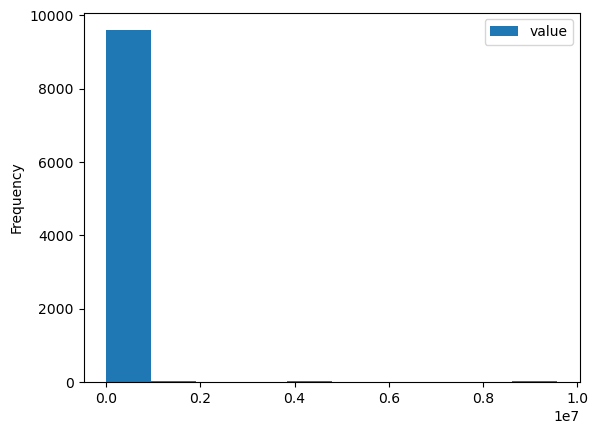

In [891]:
series.plot.hist()

<AxesSubplot:xlabel='year'>

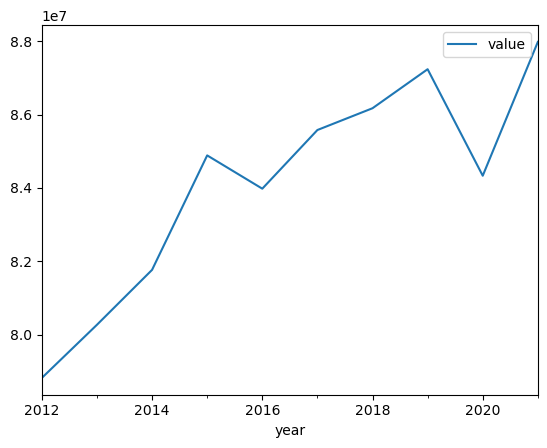

In [857]:
series.resample('Y').sum().plot()

In [962]:
# frequency conversion and resampling of time series
ts_year_avg = series.value.resample('Y').sum()

<AxesSubplot:xlabel='year'>

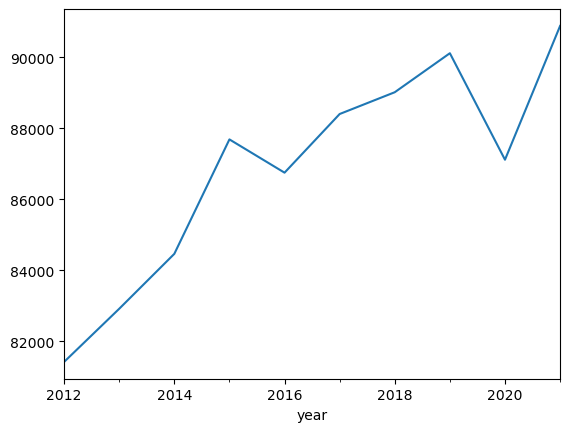

In [1004]:
series.value.resample('Y').mean().plot()

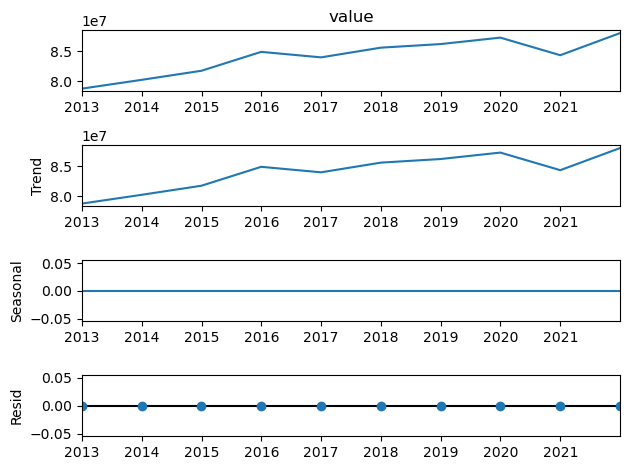

In [963]:
decomposition = seasonal_decompose(ts_year_avg, model='additive') # multiplicative
fig = decomposition.plot()
plt.show()

- As we can see, there is a upward trend and an annual stable seasonality in the data. 
- Insofar as the series' mean fluctuates seasonally and is consequently time-dependent, a stable seasonal pattern is not stationary.

If you have clear trend and seasonality in your time series, then model these components, remove them from observations.

Determine Seasonality in Time Series Data and Remove It

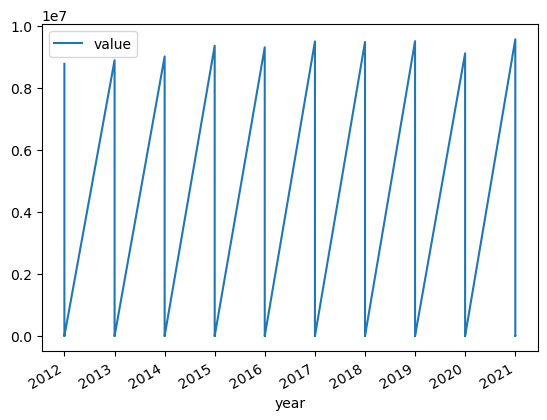

In [1006]:
series.plot()
plt.show()

1. Seasonal Adjustment with Differencing

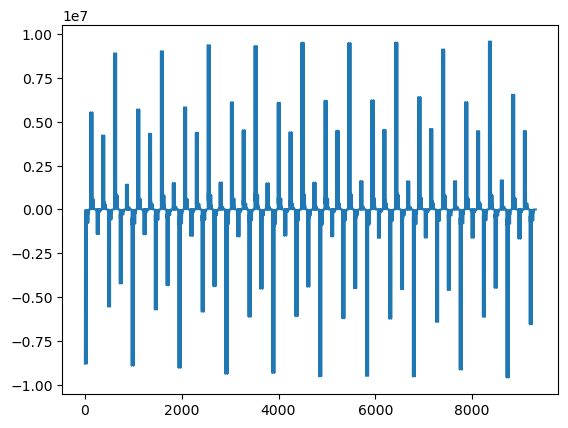

In [1007]:
days_in_year = 365
X = series.values
diff = list()
days_in_year = 365
for i in range(days_in_year, len(X)):
	value = X[i] - X[i - days_in_year]
	diff.append(value)
plt.plot(diff)
plt.show()

#### Checks for Stationarity

Look at Plots

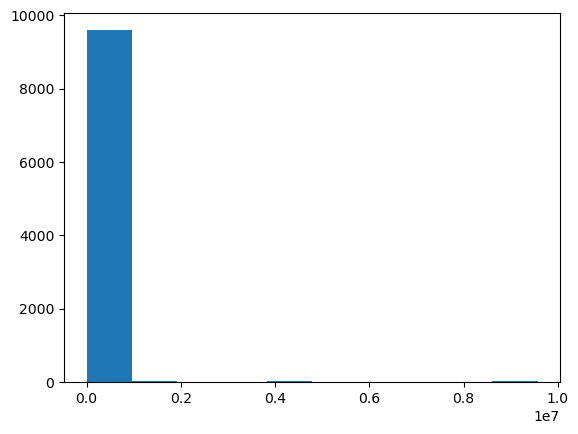

In [899]:
X = series.value.values.astype(int)
# X = np.log(X)
plt.hist(X)
plt.show()
# plt.plot(X)
# plt.show()

Reviewing the plot of the time series again, we can see that there is an obvious seasonality component, and it looks like the seasonality component is growing.

In [903]:
X = series.values
split = int(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1=%f, mean2=%f' % (mean1, mean2)) 
print('\nvariance1=%f, variance2=%f' % (var1, var2))


mean1=84650.572054, mean2=89111.623248

variance1=289604282820.434998, variance2=318497769975.337219


Running this example shows that the mean and variance values are different.

This could imply that growth is exponential from season to season. A log transform can be used to convert an exponential relationship to a linear relationship.

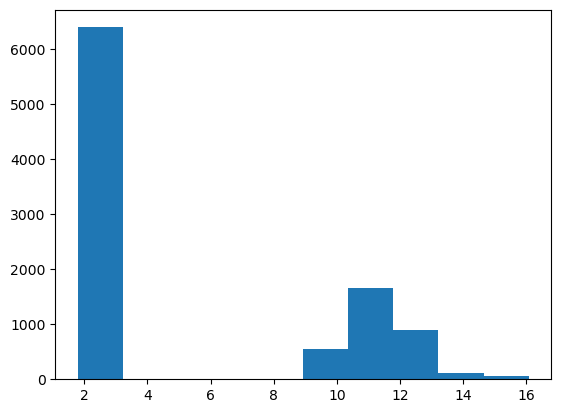

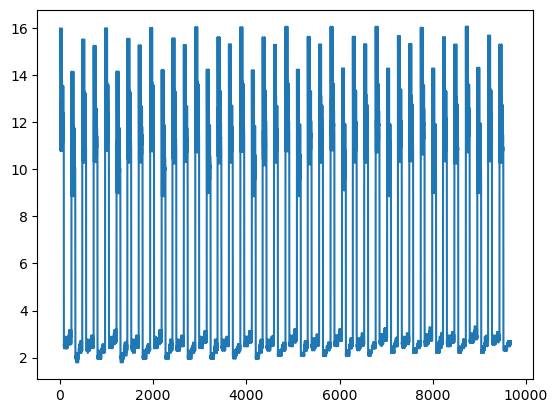

In [905]:
X = series.value.values.astype(int)
X = np.log(X)
plt.hist(X)
plt.show()
plt.plot(X)
plt.show()

In [910]:
X = series.value.values.astype(int)
X = np.log(X)
split = int(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1= %f, mean2= %f' % (mean1, mean2)) 
print('\nvariance1= %f, variance2= %f' % (var1, var2))


mean1= 5.457209, mean2= 5.570912

variance1= 18.497790, variance2= 18.150670


This is a quick and dirty method that can easily be deceived. A statistical test can be used to determine whether the difference between two samples of Gaussian random variables is real or a statistical fluke.

In [911]:
# X = np.log(X)


we will use this statistical test designed to explicitly comment on whether a univariate time series is stationary

In [912]:
X = series.value.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -11.476285
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


- we have a stationary dataset.

- Our statistic value of -11 is less than the value of -2.862 at 1%.

- This implies that the null hypothesis can be rejected with a significance level of less than 1%. (i.e. a low probability that the result is a statistical fluke). If the null hypothesis is rejected, it means that the process has no unit root and that the time series is stationary.

Let's log transform the dataset once more to improve the linearity of the value distribution and better align it with the assumptions of this statistical test.

In [916]:
X = series.value.values.astype(int)
X = np.log(X)
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -11.895281
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


- The test statistic's value is negative according to our findings.

- By observing that the value is higher than the critical values, we can see that the null hypothesis cannot be completely ruled out and that the time series is stationary as a result.

##### Evaluate Models

The goal of time series forecasting is to make accurate predictions about the future. 

Observations: 9680
Training Observations: 6388
Testing Observations: 3292


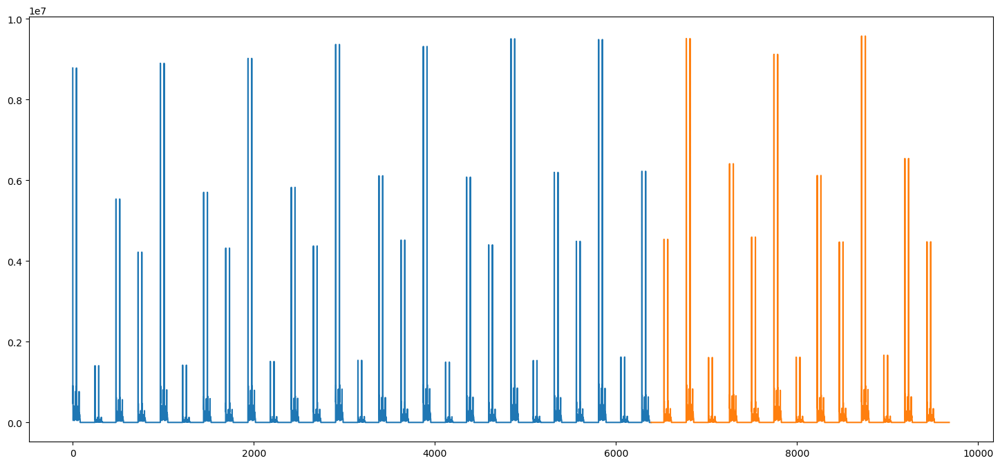

In [919]:
# Train-Test Split
X = series.value.values.astype(int)
train_size = int(len(X) * 0.66)
train, test = X[0:train_size], X[train_size:len(X)]
print('Observations: %d' % (len(X)))
print('Training Observations: %d' % (len(train)))
print('Testing Observations: %d' % (len(test)))

# plot graph
plt.figure(figsize=(18,8))
plt.plot(train)
plt.plot([None for i in train] + [x for x in test])
plt.show()

Line plot train (blue) and test (orange) split.

Any time series forecasting issue must have a baseline established.

You can estimate how well all other models will actually perform on your problem by looking at a baseline in performance.
The Zero Rule algorithm is the most widely used baseline technique for supervised machine learning.

In this case, we are using the persistence algorithm, which forecasts the anticipated result at the following time step (t+1) based on the value at the current time step (t).

To make a persistence model

In [920]:
# Create lagged dataset
values = pd.DataFrame(series.value.values.astype(float))
dataframe = pd.concat([values.shift(1), values], axis=1)
dataframe.columns = ['t', 't+1'] 
print(dataframe.head(5))

           t        t+1
0        NaN  8778000.0
1  8778000.0   466000.0
2   466000.0   907000.0
3   907000.0   306000.0
4   306000.0    84000.0


In supervised learning, the input variable, or X, is represented by the t column, and the output variable, or y, is represented by the t+1 column.

In [930]:
# split into train and test sets
X = dataframe.values
train_size = int(len(X) * 0.66)
train, test = X[1:train_size], X[train_size:]
train_X, train_y = train[:,0], train[:,1]
test_X, test_y = test[:,0], test[:,1]

In [931]:
# persistence model
def model_persistence(x):
    return x

In [932]:
from sklearn.metrics import mean_squared_error

In [934]:
# walk-forward validation
predictions = list()
for x in test_X:
    yhat = model_persistence(x)
    predictions.append(yhat)
rmse = np.sqrt(mean_squared_error(test_y, predictions))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 742608.512


In this case, the RMSE is less than `742608.512` in the test dataset.

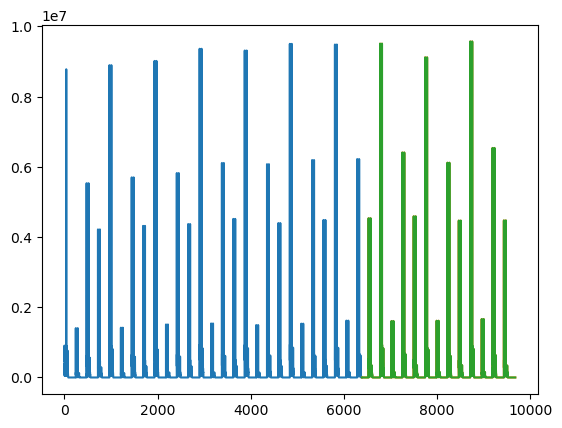

In [944]:
# plot predictions and expected results
plt.plot(train_y)
plt.plot([None for i in train_y] + [x for x in test_y])
plt.plot([None for i in train_y] + [x for x in predictions]) 
plt.show()

In [946]:
# calculate residuals
residuals = [test_y[i]-predictions[i] for i in range(len(predictions))]
residuals = pd.DataFrame(residuals)
print(residuals.head())

      0
0  0.96
1 -1.38
2  0.27
3  1.61
4 -0.10


This all together and gives us a set of residual forecast errors that we can explore.

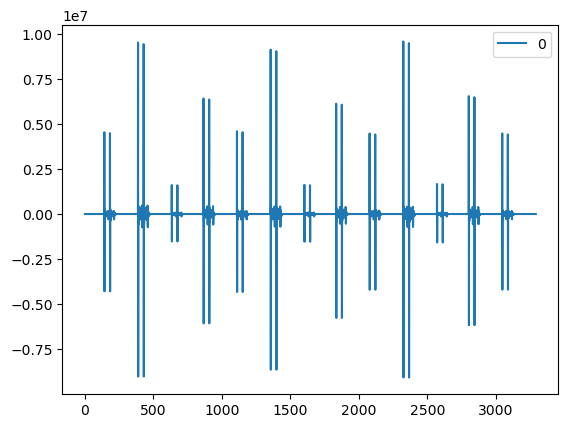

In [949]:
# plot residuals
residuals.plot()
plt.show()

In [950]:
# summary statistics
print(residuals.describe())


                  0
count  3.292000e+03
mean   3.037667e-04
std    7.427213e+05
min   -9.066000e+06
25%   -2.022500e+00
50%   -4.000000e-02
75%    1.260000e+00
max    9.569986e+06


- The mean (average) error value exceeds zero.
- It implies that there might be some bias and that by carrying out a bias correction, we might be able to further enhance the model. This could be achieved by increasing forecasts by the mean residual error (3.037667e-04). This may be effective in this situation, but it is a crude method of bias correction.

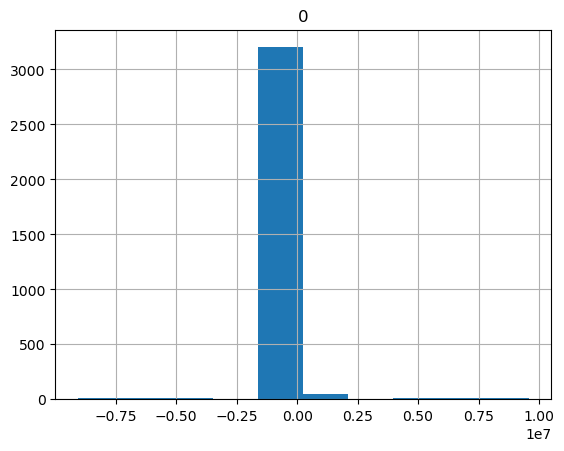

In [951]:
# histogram plot
residuals.hist()
plt.show()


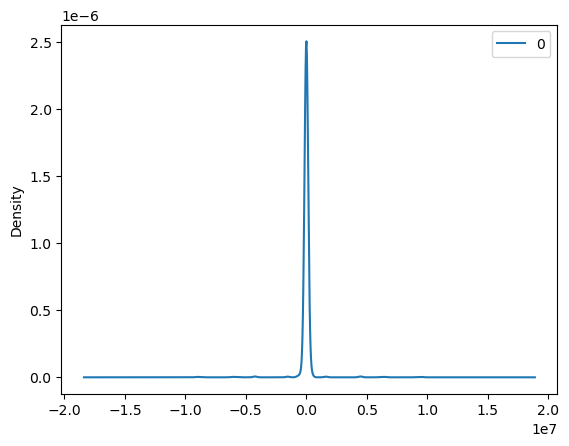

In [952]:
# density plot
residuals.plot(kind='kde')
plt.show()

Lets Residual Q-Q Plot.

To compares the two distributions and see how similar or different they happen to be.

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



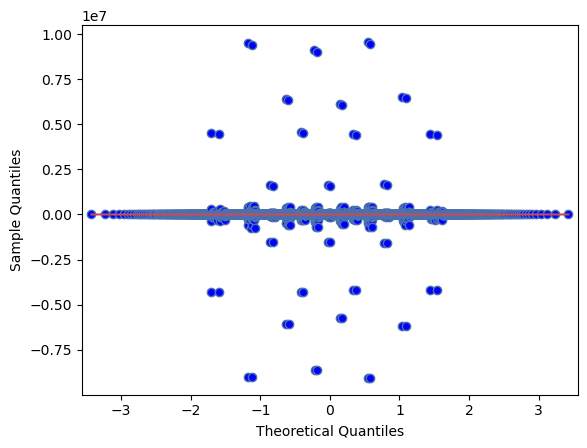

In [954]:
from statsmodels.graphics.gofplots import qqplot

qqplot(residuals, line='r')
plt.show()

check the residual time series for autocorrelation.


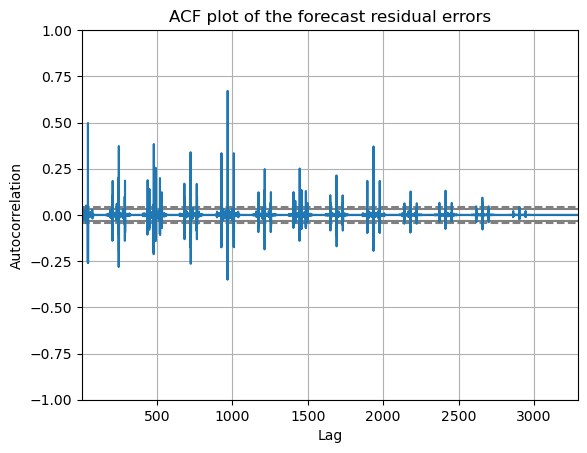

In [966]:
# Residual Autocorrelation Plot
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(residuals)
plt.title('ACF plot of the forecast residual errors')
plt.show()

FORECAST

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

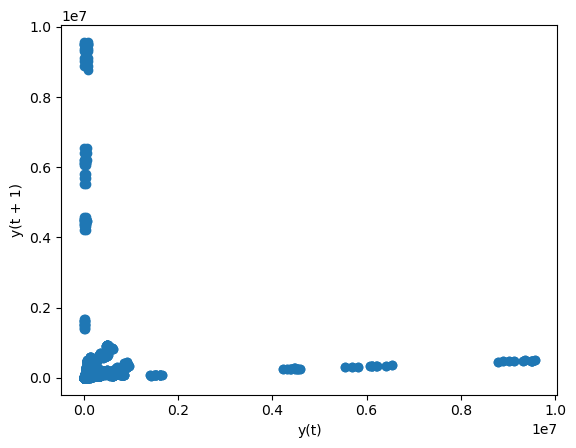

In [968]:
# from pandas.plotting import lag_plot

# lag_plot(series.value)

`Description`

- We already know that a stationary time series is one in which the mean and variance remain constant over time. And we can see that our graph is a stationary time series. 


Now lets check stationary of time series. We can check stationarity using the following methods:
    
- Plotting Rolling Statistics: Let's say the window size is 12, and the rolling mean and variance are used to determine whether the window is stationary.

- Dickey-Fuller Test: A Test Statistic and a few Critical Values for various levels of confidence make up the test results. When the test statistic falls below the threshold, we can infer that the time series is stationary.

In [688]:
# adfuller library 
from statsmodels.tsa.stattools import adfuller

# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
    
    
# check_mean_std
def check_mean_std(ts, time_range=12):
    #Rolling statistics
    # working with the first 12 month
    rolmean = ts.rolling(window=time_range).mean()
    rolstd = ts.rolling(window=time_range).std()

    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()

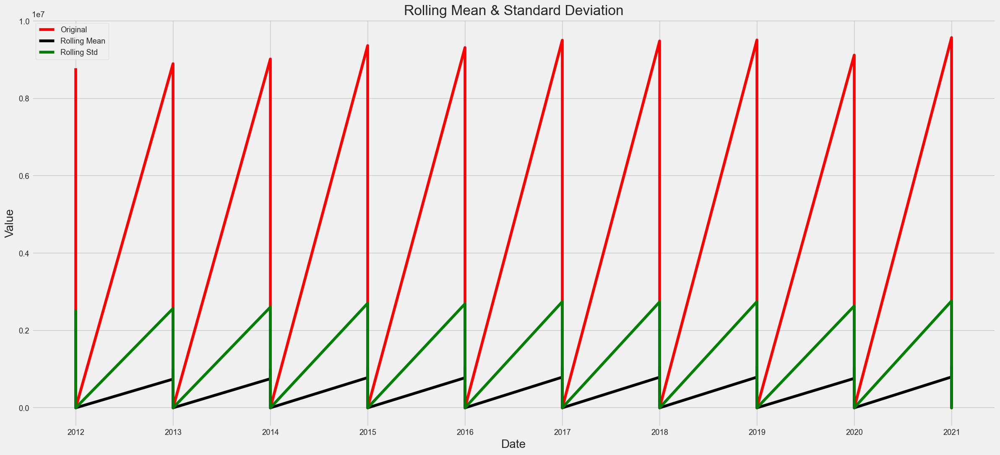

Test statistic:  -11.476284839554983
p-value:  5.1216278832497596e-21
Critical Values: {'1%': -3.4310284609439146, '5%': -2.8618398381492414, '10%': -2.566929598730403}


In [689]:
# check stationary: mean, variance(std)and adfuller test

check_mean_std(ts)
check_adfuller(ts.value)

- Our first criteria for stationary is constant mean. So we passed because mean is constant as you can see from plot(black line) above . (yes stationary)

- Second one is constant variance. It looks like constant. (yes stationary).


- Third one is that If the test statistic is less than the critical value, we can say that time series is stationary. 

    Lets look:
        Test statistic:  -11.4762
        and critical values = {'1%': -3.4310284609439146, '5%': -2.8618398381492414, '10%': -2.566929598730403}. Test statistic is bigger than the critical values. (no stationary)
        
As a result, we sure that our time series is not stationary.

Lets make time series stationary at the next part.


Make a Time Series Stationary?

    There are two causes of time series non-stationarity.
    Changing mean over time is a trend. For time series to be stationary, we need a constant mean.
    Seasonality: Changes at a particular time. For time series to be stationary, we require constant variations.
    Initial trend(constant mean) problem to solve
    Moving average is the most common approach.
    Average movement: We have a window that calculates the mean over the previous n samples. The window size is 'n'.

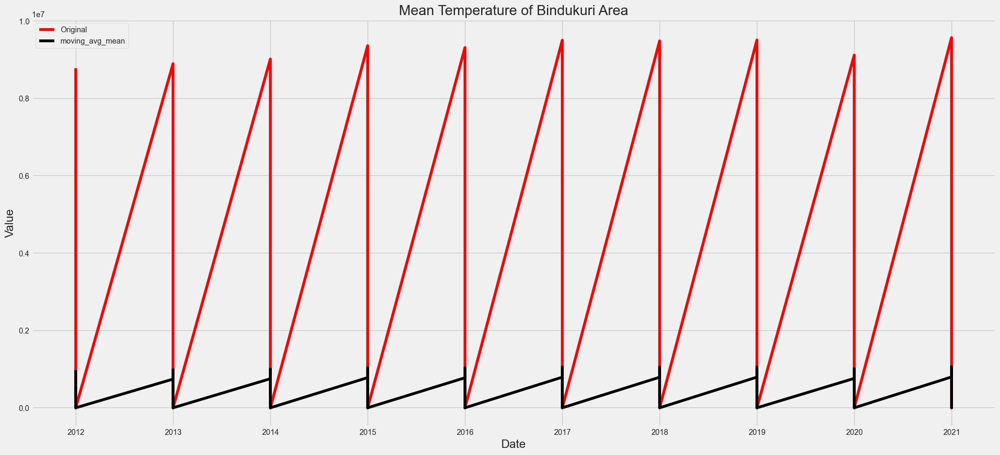

In [690]:
# Moving average method
window_size = 12

moving_avg = ts.rolling(window_size).mean()
plt.figure(figsize=(22,10))
plt.plot(ts, color = "red",label = "Original")
plt.plot(moving_avg, color='black', label = "moving_avg_mean")
plt.title("Mean Temperature of Bindukuri Area")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.show()

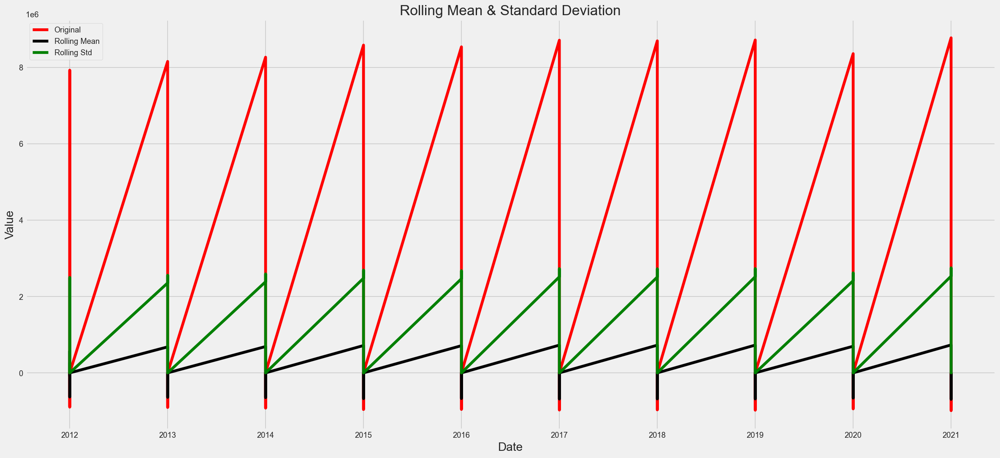

Test statistic:  -32.952609716810294
p-value:  0.0
Critical Values: {'1%': -3.431029236131987, '5%': -2.8618401806956872, '10%': -2.5669297810688088}


In [691]:
ts_moving_avg_diff = ts - moving_avg
ts_moving_avg_diff.dropna(inplace=True) # first 12 is nan value due to window size

# check stationary: mean, variance(std)and adfuller test
check_mean_std(ts_moving_avg_diff)
check_adfuller(ts_moving_avg_diff.value)


`Description`

- Constant mean criteria: mean looks like constant as you can see from plot(black line) above . (yes stationary)
- Second one is constant variance. It looks like constant. (yes stationary)


We achieve stationary time series. However lets look at one more method to avoid trend and seasonality.
Differencing method: It is one of the most common method. Idea is that take difference between time series and shifted time series.

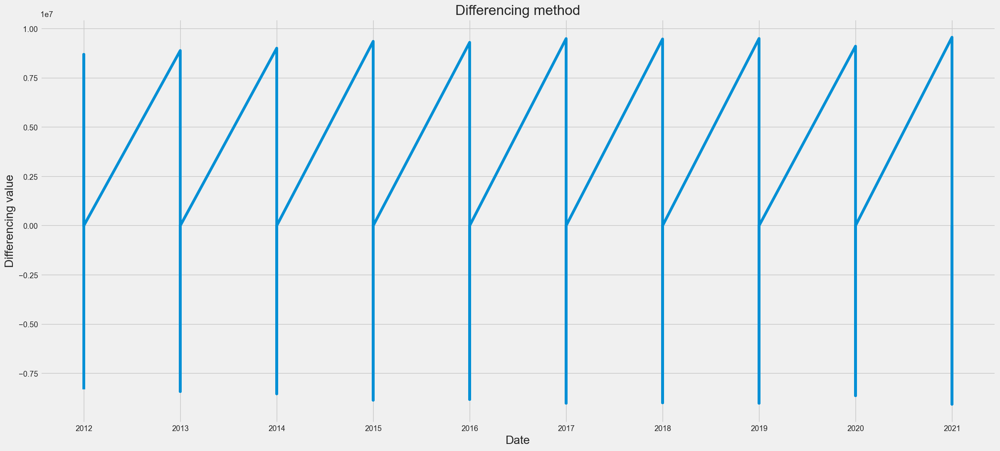

In [692]:
# differencing method
ts_diff = ts - ts.shift()
plt.figure(figsize=(22,10))
plt.plot(ts_diff)
plt.title("Differencing method") 
plt.xlabel("Date")
plt.ylabel("Differencing value")
plt.show()

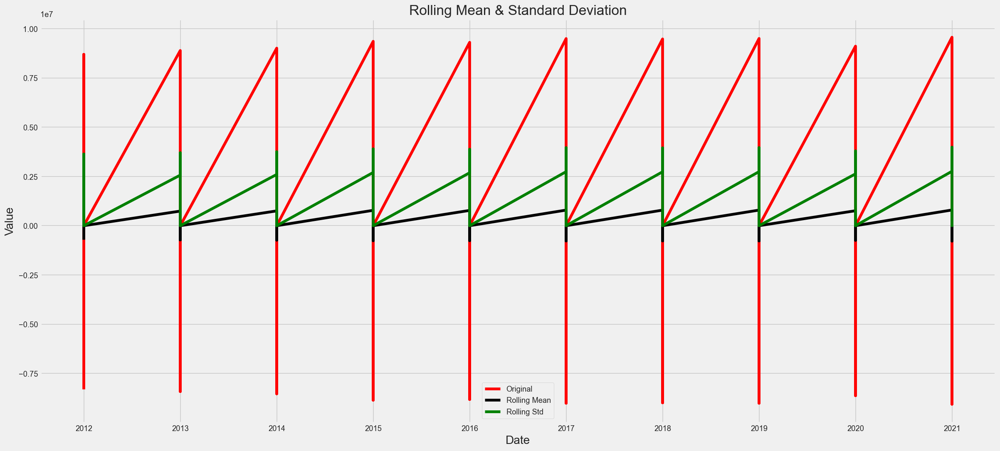

Test statistic:  -26.939532026150804
p-value:  0.0
Critical Values: {'1%': -3.4310285313424345, '5%': -2.861839869257519, '10%': -2.5669296152894234}


In [693]:
ts_diff.dropna(inplace=True) # due to shifting there is nan values

# check stationary: mean, variance(std)and adfuller test
check_mean_std(ts_diff)
check_adfuller(ts_diff.value)


- Constant mean criteria: mean looks like constant as you can see from plot(black line) above . (yes stationary)
- Second one is constant variance. It looks like constant. (yes stationary)
- The test statistic is smaller than the 1% critical values so we can say with 99% confidence that this is a stationary series. (yes stationary)

### Forecasting a Time Series

We saw that moving average and differencing methods, which are two distinct approaches, were used to prevent trend and seasonality issues.

- For prediction(forecasting) we will use ts_diff time series that is result of differencing method. There is no reason I only choose it.

- We will use the ts_diff time series, which is the output of the differencing method, for prediction (forecasting). I didn't pick it for any particular reason.

- ARIMA, also known as Auto-Regressive Integrated Moving Averages, is another prediction technique.


    AR: Auto-Regressive (p): The dependent variable's lags are what make an auto-regressive (AR) term. For instance, if p is 3, we will predict x using x(t-1), x(t-2), and x(t-3) (t)
    
    I: Integrated (d): These are the nonseasonal differences in number. In our case, we'll use the first order difference as an illustration. We then set d=0 and pass that variable.
    
    MA: Moving Averages (q): In the prediction equation, MA terms represent lags in forecast errors.
        
        
- (p,d,q) is parameters of ARIMA model.


- We'll use two different plots to select the p, d, and q parameters.

    Autocorrelation Function (ACF): measuring the correlation between time series and their lag-time equivalents.
    
    Partial Autocorrelation Function (PACF): After removing the variations already accounted for by the intervening comparisons, this calculates the correlation between the time series and lagged version of the time series.

/Users/Jeff/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:667: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.



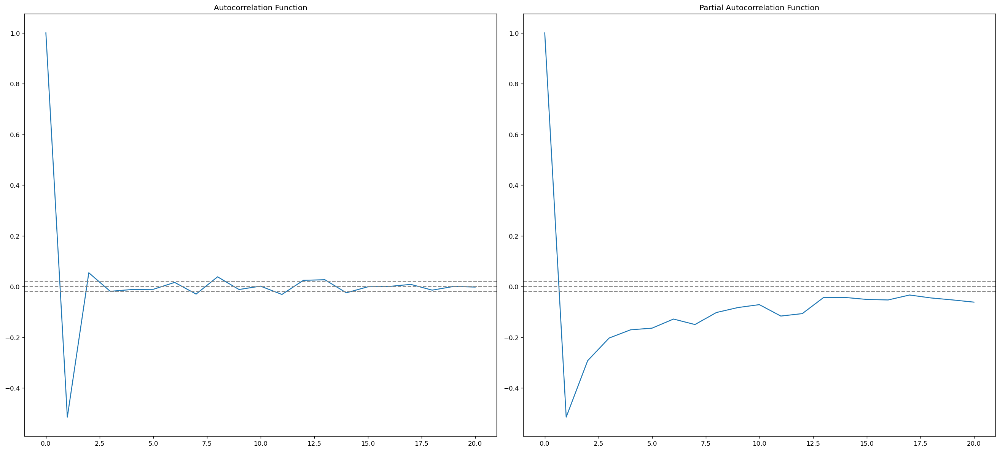

In [782]:
# ACF and PACF 
from statsmodels.tsa.stattools import acf, pacf

lag_acf = acf(ts_diff, nlags=20)
lag_pacf = pacf(ts_diff, nlags=20, method='ols')

# ACF
plt.figure(figsize=(22,10))

plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

# PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

Two dotted lines are the confidence interevals. We use these lines to determine the ‘p’ and ‘q’ values
    
    Choosing p: The lag value where the PACF chart does not crosses the upper confidence interval for the first time. p=0.
    Choosing q: The lag value where the ACF chart crosses the upper confidence interval for the first time. q=1.
    
    
Now lets use (1,0,1) as parameters of ARIMA models and predict

    ARIMA: from statsmodels library
    <!-- [issue] datetime: we will use it start and end indexes of predict method -->

In [700]:
from statsmodels.tsa.arima_model import ARIMA

# 1,1,2 ARIMA Model
model = ARIMA(np.array(ts), order=(1,1,2))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 9679
Model:                 ARIMA(1, 1, 2)   Log Likelihood             -141640.307
Method:                       css-mle   S.D. of innovations         548363.236
Date:                Sat, 16 Jul 2022   AIC                         283290.614
Time:                        20:16:06   BIC                         283326.502
Sample:                             1   HQIC                        283302.782
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.2231    164.499      0.032      0.975    -317.190     327.636
ar.L1.D.y      0.5430      0.090      6.027      0.000       0.366       0.720
ma.L1.D.y     -1.4725      0.092    -15.983      0.0

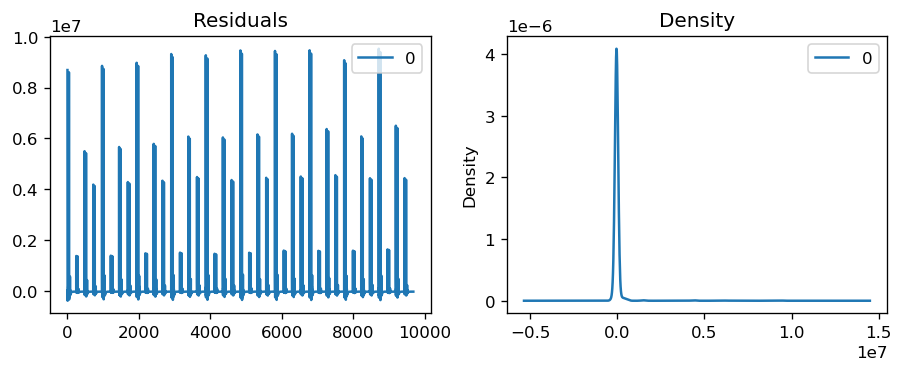

In [780]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

The residual errors seem fine with near zero mean and uniform variance. 

Let’s plot the actuals against the fitted values using plot_predict().

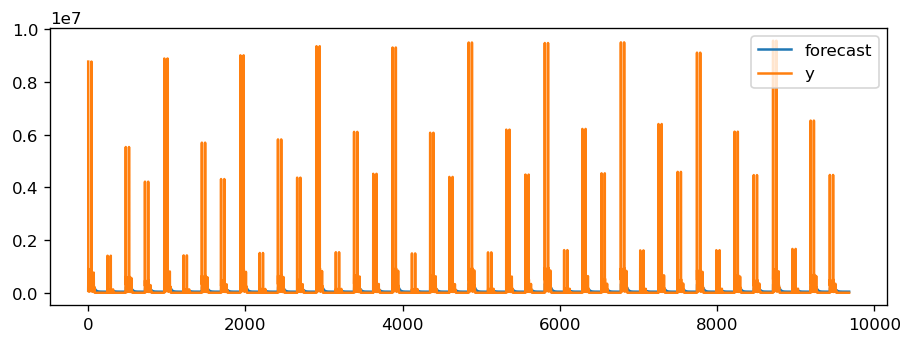

In [781]:
# Actual vs Fitted
model_fit.plot_predict(dynamic=False)
plt.show()

When you set dynamic=False the in-sample lagged values are used for prediction.

That is, the model gets trained up until the previous value to make the next prediction. This can make the fitted forecast and actuals look artificially good.



# analysis of impact pre BREXIT and POST BREXIT

In [973]:
uk_df

,state,area,area_type,sex,pay_standard,work_standard,work_time,2012_pay,2012_conf%,2013_pay,...,2017_pay,2017_conf%,2018_pay,2018_conf%,2019_pay,2019_conf%,2020_pay,2020_conf%,2021_pay,2021_conf%
0,England,England,country,Male,basic,Full Time,Weekly,8778000.0,0.2,8895000.0,...,9502000.0,0.2,9483000.0,0.2,9508000.0,0.2,9117000.0,0.3,9570000.0,0.3
1,Wales,Wales,country,Male,basic,Full Time,Weekly,466000.0,1.9,473000.0,...,487000.0,1.9,489000.0,1.9,492000.0,1.9,484000.0,2.2,504000.0,2.2
2,Scotland,Scotland,country,Male,basic,Full Time,Weekly,907000.0,1.3,900000.0,...,941000.0,1.3,949000.0,1.3,931000.0,1.4,859000.0,1.7,906000.0,1.6
3,Northern Ireland,Northern Ireland,country,Male,basic,Full Time,Weekly,306000.0,2.3,279000.0,...,358000.0,2.2,343000.0,2.3,368000.0,2.3,414000.0,2.4,448000.0,2.3
4,England,Durham (County),ecounty,Male,basic,Full Time,Weekly,84000.0,4.5,81000.0,...,85000.0,4.6,90000.0,4.6,92000.0,4.6,76000.0,5.8,88000.0,5.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3116,England,West Midlands (Met County),ecounty,Female,overtime,Part Time,Hours,0.8,10.0,0.8,...,0.6,12.0,0.6,11.0,0.6,11.0,0.5,14.0,0.6,13.0
3117,England,Essex,ecounty,Female,overtime,Part Time,Hours,0.6,14.0,0.7,...,0.6,13.0,0.5,14.0,0.6,16.0,0.4,17.0,0.6,16.0
3118,England,Outer London,ecounty,Female,overtime,Part Time,Hours,0.8,7.7,0.7,...,0.5,8.6,0.7,9.0,0.6,8.3,0.4,12.0,0.5,9.9
3119,England,Hampshire,ecounty,Female,overtime,Part Time,Hours,0.6,12.0,0.5,...,0.5,14.0,0.5,15.0,0.5,14.0,0.5,17.0,0.5,14.0


Brexit resulted in the EU experiencing a net population decrease of 13% between 1 January 2019 and 1 January 2020. Eurostat data suggests that there would otherwise have been a net increase over the same period.

ref: https://en.wikipedia.org/wiki/Impact_of_Brexit_on_the_European_Union#:~:text=Brexit%20resulted%20in%20the%20EU,increase%20over%20the%20same%20period.

Before brexit

In [975]:
# brexit_df = clean_df.drop('')
# hourly_state_df
# hourly_state_df = 
fulltimehourly_df[['state', '2020_pay',]]

,state,2020_pay
41,England,9117000.0
42,Wales,484000.0
43,Scotland,859000.0
44,Northern Ireland,414000.0
45,England,76000.0
...,...,...
2225,England,20.4
2226,England,15.84
2227,England,15.27
2228,England,14.95


After Brexit

31 January 2020, The UK is the only sovereign country to have left the EU.

This Dataset is a monthly data on the UK's trade in goods and services, including trade inside and outside the EU.

Therefore this is pre-Brexit.

In [20]:
# Create excel
brexit_df = pd.read_excel('data/brexit/makeovermonday-2021w13/UK Exports to the EU.xlsx')

brexit_df.columns = ['month','category','exports','imports','balance']
# Changing the datatype
brexit_df['month'] = brexit_df["month"].astype("datetime64")

# Setting the Date as index
brexit_df = brexit_df.set_index('month')

# show dataframe
brexit_df.head(10)

,category,exports,imports,balance
month,,,,
1997-01-01,Food & live animals,596,1075,-479
1997-02-01,Food & live animals,626,1085,-459
1997-03-01,Food & live animals,601,1088,-487
1997-04-01,Food & live animals,610,1255,-645
1997-05-01,Food & live animals,631,1106,-475
1997-06-01,Food & live animals,622,1041,-419
1997-07-01,Food & live animals,593,1059,-466
1997-08-01,Food & live animals,577,1060,-483
1997-09-01,Food & live animals,556,1058,-502


In [21]:
brexit_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2890 entries, 1997-01-01 to 2021-01-01
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   category  2890 non-null   object
 1   exports   2890 non-null   int64 
 2   imports   2890 non-null   int64 
 3   balance   2890 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 112.9+ KB


In [63]:
brexit_df.describe()

,exports,imports,balance
count,2890.000000,2890.000000,2890.000000
mean,1349.801730,1721.006920,-371.205190
std,1395.962258,2013.723364,1042.879652
min,1.000000,5.000000,-4786.000000
25%,215.000000,445.250000,-656.500000
50%,1036.000000,1089.000000,-244.000000
75%,2050.500000,2251.750000,-29.000000
max,11124.000000,13332.000000,2822.000000


### EDA

In [36]:
brexit_df['category'].value_counts()

Food & live animals                289
Beverages & tobacco                289
Crude materials                    289
Fuels                              289
Animal & vegetable oils & fats     289
Chemicals                          289
Material manufactures              289
Machinery & transport equipment    289
Miscellaneous manufactures         289
Unspecified goods                  289
Name: category, dtype: int64

<AxesSubplot:ylabel="Quarterly profit ($ '000)">

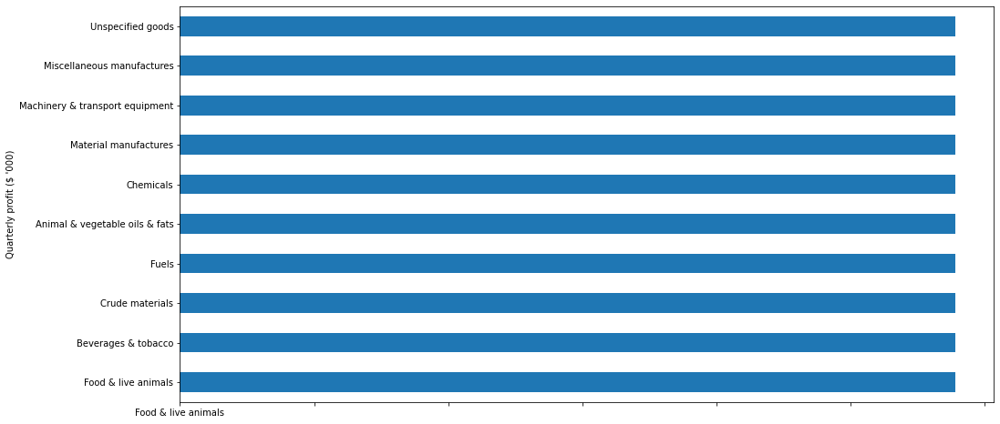

In [56]:
# # Draw a bar-plot
# brexit_df['category'].value_counts().sort_values().plot(color='lightgrey')
brexit_df['category'].value_counts().sort_values().plot(kind = 'barh', figsize=(16,8))
plt.ylabel("Quarterly profit ($ '000)")

# # Now rather use a line plot.
# brexit_df['category'].value_counts().sort_values().plot.line(marker="o")
# ax.set_ylabel("Quarterly profit ($ '000)")
# plt.show()

In [61]:
brexit_df[['exports']]

,exports
month,
1997-01-01,596
1997-02-01,626
1997-03-01,601
1997-04-01,610
1997-05-01,631
...,...
2020-09-01,7
2020-10-01,17
2020-11-01,15


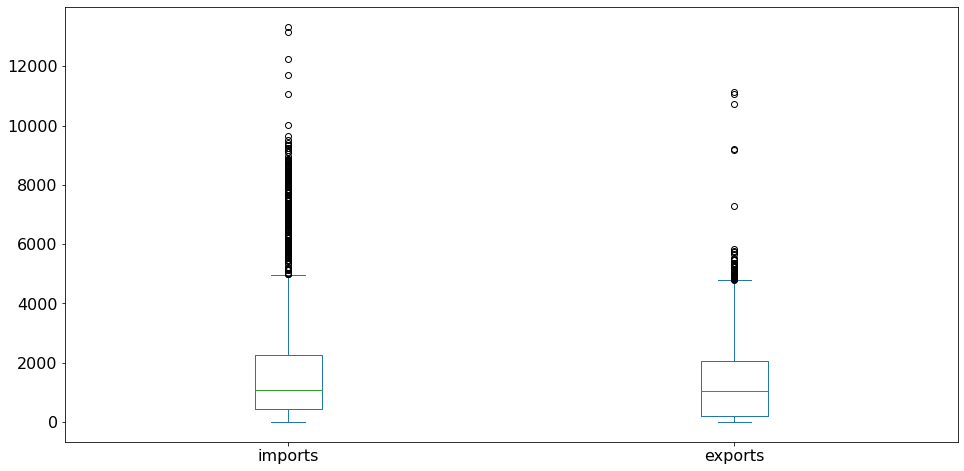

In [69]:
# # Draw a box-plot

ax = brexit_df[['imports','exports']].plot.box(fontsize=16, figsize=(16,8))
plt.show()


In this figure we see how the value of UK on exports  is greater than imports .

- Either category achieved the highest possible exchange.
- the spread (interquartile distance) when using the problem solving method is smaller

- It is also the position with high variability, indicating that something about the high importation rate.
- The median is also great balanced between  the exports' quantiles for this box plot, but not with balance when compared.

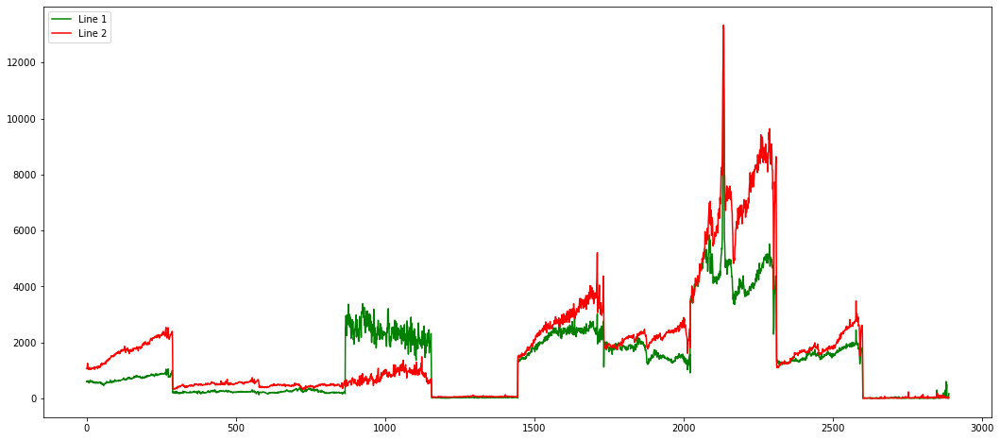

In [33]:
line_1 = brexit_df.exports.values
line_2 = brexit_df.imports.values

fig, ax = plt.subplots(figsize=(18,8))

ax.plot(line_1, color = 'green', label = 'Line 1')
ax.plot(line_2, color = 'red', label = 'Line 2')
ax.legend(loc = 'upper left')
plt.show()

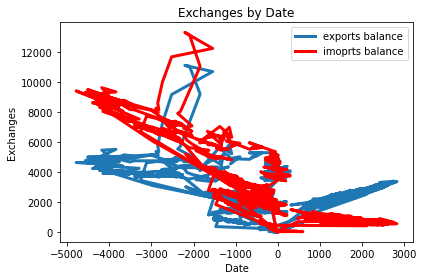

In [27]:
# Plot time series

plt.plot(brexit_df.exports, label='exports balance', 
         linewidth=3)
plt.plot(brexit_df.imports, brexit_df.balance, color='red', 
         label='imoprts balance', linewidth=3)

# Add title and labels

plt.title('Exchanges by Date')
plt.xlabel('Date')
plt.ylabel('Exchanges')

# Add legend

plt.legend()

# Auto space

plt.tight_layout()

# Display plot

plt.show()

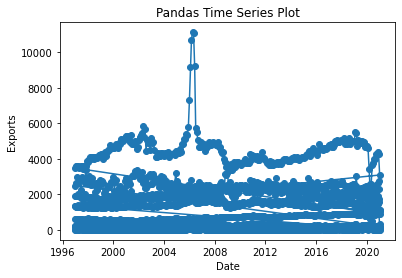

In [24]:
# Import Library

import matplotlib.pyplot as plt

# Plot
plt.plot(brexit_df["exports"], marker='o')

# Labelling 

plt.xlabel("Date")
plt.ylabel("Exports")
plt.title("Pandas Time Series Plot")

# Display

plt.show()

In [ ]:
Objectives

What works and what could be improved with this chart?
How can you make it better?